# CODE : A Study on the Visual Elements of Book Covers using Machine Learning Techniques

Student ID: 2213186

In [248]:
%%capture
import warnings
warnings.filterwarnings("ignore")

## THE DATASET

In [1]:
# Importing Required Libraries
import pandas as pd

#### Loading the Dataset

In [2]:
# Loading the dataset
# Loading the data
df_1 = pd.read_csv("D:/DATA SCIENCE AND ITS APPLICATIONS/DISSERTATION/Data/book30-listing-train.csv", encoding = "ISO-8859-1")
df_2 = pd.read_csv("D:/DATA SCIENCE AND ITS APPLICATIONS/DISSERTATION/Data/book30-listing-test.csv", encoding = "ISO-8859-1")
# Creating column headers
df_1.columns = ['Index', 'Filename', 'URL', 'Title', 'Author', 'Category_ID', 'Category']
df_2.columns = ['Index', 'Filename', 'URL', 'Title', 'Author', 'Category_ID', 'Category']
# combining the separate data
df = pd.concat([df_1, df_2], axis=0)

In [3]:
# Folder containing the images
images_directory = r"D:\DATA SCIENCE AND ITS APPLICATIONS\DISSERTATION\Data\Images\224x224"

#### Dataset Description

In [4]:
df.shape

(56998, 7)

In [5]:
df.head()

,Index,Filename,URL,Title,Author,Category_ID,Category
0,1404803335,1404803335.jpg,http://ecx.images-amazon.com/images/I/51UJnL3T...,"Magnets: Pulling Together, Pushing Apart (Amaz...",Natalie M. Rosinsky,4,Children's Books
1,1446276082,1446276082.jpg,http://ecx.images-amazon.com/images/I/51MGUKhk...,Energy Security (SAGE Library of International...,NaN,10,Engineering & Transportation
2,1491522666,1491522666.jpg,http://ecx.images-amazon.com/images/I/51qKvjsi...,An Amish Gathering: Life in Lancaster County,Beth Wiseman,9,Christian Books & Bibles
3,970096410,0970096410.jpg,http://ecx.images-amazon.com/images/I/51qoUENb...,City of Rocks Idaho: A Climber's Guide (Region...,Dave Bingham,26,Sports & Outdoors
4,8436808053,8436808053.jpg,http://ecx.images-amazon.com/images/I/41aDW5pz...,"Como vencer el insomnio. Tecnicas, reglas y co...",Choliz Montanes,11,"Health, Fitness & Dieting"


In [6]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 56998 entries, 0 to 5698
Data columns (total 7 columns):
 #   Column       Non-Null Count  Dtype 
---  ------       --------------  ----- 
 0   Index        56998 non-null  object
 1   Filename     56998 non-null  object
 2   URL          56998 non-null  object
 3   Title        56998 non-null  object
 4   Author       53165 non-null  object
 5   Category_ID  56998 non-null  int64 
 6   Category     56998 non-null  object
dtypes: int64(1), object(6)
memory usage: 3.5+ MB


#### Checking for null values

In [7]:
df.isna().sum()

Index             0
Filename          0
URL               0
Title             0
Author         3833
Category_ID       0
Category          0
dtype: int64

#### Checking for duplicates

In [8]:
# Check for duplicate rows
duplicate_rows = df[df.duplicated()]
# Display the duplicate rows
print("Duplicate Rows except first occurrence:")
print(duplicate_rows)

Duplicate Rows except first occurrence:
Empty DataFrame
Columns: [Index, Filename, URL, Title, Author, Category_ID, Category]
Index: []


In [9]:
# Checking duplicate values in Title column
# Check for duplicates in the specified column
duplicates_in_column = df['Title'].duplicated().sum()

# Display the number of duplicates in the specified column
print(f"\nNumber of duplicates in column 'Title': {duplicates_in_column}")


Number of duplicates in column 'Title': 378


## COLOR EXTRACTION

In [10]:
# Importing required libraries
import os
import numpy as np
import matplotlib.image as img
from sklearn.cluster import KMeans

In [11]:
# Create a function to extract colors
def extract_colours(image):
    # Get the dimensions
    w, h, d = tuple(image.shape)
    # Reshape the image into an array where each row represents a pixel
    pixel = np.reshape(image, (w * h, d))
    # Set the desired number of colors in the image
    n_colours = 5
    # Create a KMeans model with the specified number of clusters and fit it to the pixels
    model = KMeans(n_clusters=n_colours, random_state=42).fit(pixel)
    # Get the cluster centers from the model
    colour_palette = np.uint8(model.cluster_centers_)
    # Get the RGB codes from the clusters
    rgb_colours = colour_palette.tolist()
    return rgb_colours

In [12]:
def apply_extraction(row):
    image_path = os.path.join(images_directory, row['Filename'])
    image = img.imread(image_path)
    colours = extract_colours(image)
    return colours

In [13]:
# Applying the colour extraction to all the rows
df['Colours'] = df.apply(apply_extraction, axis=1)

C:\Users\reeth\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
C:\Users\reeth\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
C:\Users\reeth\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
C:\Users\reeth\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
C:\Users\reeth\anaconda3\lib\site-packages\sklearn\clust

In [14]:
df.to_csv('df_colours.csv', index=False)

In [15]:
df.head()

,Index,Filename,URL,Title,Author,Category_ID,Category,Colours
0,1404803335,1404803335.jpg,http://ecx.images-amazon.com/images/I/51UJnL3T...,"Magnets: Pulling Together, Pushing Apart (Amaz...",Natalie M. Rosinsky,4,Children's Books,"[[107, 182, 220], [186, 37, 28], [235, 233, 41..."
1,1446276082,1446276082.jpg,http://ecx.images-amazon.com/images/I/51MGUKhk...,Energy Security (SAGE Library of International...,NaN,10,Engineering & Transportation,"[[5, 3, 4], [142, 3, 3], [172, 131, 105], [69,..."
2,1491522666,1491522666.jpg,http://ecx.images-amazon.com/images/I/51qKvjsi...,An Amish Gathering: Life in Lancaster County,Beth Wiseman,9,Christian Books & Bibles,"[[43, 35, 14], [244, 250, 186], [135, 138, 42]..."
3,970096410,0970096410.jpg,http://ecx.images-amazon.com/images/I/51qoUENb...,City of Rocks Idaho: A Climber's Guide (Region...,Dave Bingham,26,Sports & Outdoors,"[[88, 131, 209], [43, 49, 49], [152, 183, 236]..."
4,8436808053,8436808053.jpg,http://ecx.images-amazon.com/images/I/41aDW5pz...,"Como vencer el insomnio. Tecnicas, reglas y co...",Choliz Montanes,11,"Health, Fitness & Dieting","[[248, 249, 249], [126, 77, 53], [167, 126, 93..."


Code Reference : https://www.geeksforgeeks.org/extract-dominant-colors-of-an-image-using-python/

In [16]:
df.shape

(56998, 8)

## TEXT AREA CALCULATION

In [17]:
# Importing required libraries
import easyocr
from PIL import Image

In [18]:
def read_text(image):
    reader = easyocr.Reader(['en'], gpu=False)
    result = reader.readtext(image)
    return result

In [19]:
def calculate_area(row):
    area = 0.0
    image_path = os.path.join(images_directory, row['Filename'])
    text_output = read_text(image_path)
    img = Image.open(image_path)
    w, h = img.size
    for detection in text_output:
        top_left = tuple([int(val) for val in detection[0][0]])
        x1, y1 = top_left
        bottom_right = tuple([int(val) for val in detection[0][2]])
        x2, y2 = bottom_right
        a = (((x2-x1)*(y2-y1))/(h*w))*100
        area += a
    return round(area, 2)

In [20]:
df['Text_Area'] = df.apply(calculate_area, axis=1)

Using CPU. Note: This module is much faster with a GPU.
Using CPU. Note: This module is much faster with a GPU.
Using CPU. Note: This module is much faster with a GPU.
Using CPU. Note: This module is much faster with a GPU.
Using CPU. Note: This module is much faster with a GPU.
Using CPU. Note: This module is much faster with a GPU.
Using CPU. Note: This module is much faster with a GPU.
Using CPU. Note: This module is much faster with a GPU.
Using CPU. Note: This module is much faster with a GPU.
Using CPU. Note: This module is much faster with a GPU.
Using CPU. Note: This module is much faster with a GPU.
Using CPU. Note: This module is much faster with a GPU.
Using CPU. Note: This module is much faster with a GPU.
Using CPU. Note: This module is much faster with a GPU.
Using CPU. Note: This module is much faster with a GPU.
Using CPU. Note: This module is much faster with a GPU.
Using CPU. Note: This module is much faster with a GPU.
Using CPU. Note: This module is much faster with

In [21]:
df.to_csv('df_colours_text.csv', index=False)

In [22]:
df.head()

,Index,Filename,URL,Title,Author,Category_ID,Category,Colours,Text_Area
0,1404803335,1404803335.jpg,http://ecx.images-amazon.com/images/I/51UJnL3T...,"Magnets: Pulling Together, Pushing Apart (Amaz...",Natalie M. Rosinsky,4,Children's Books,"[[107, 182, 220], [186, 37, 28], [235, 233, 41...",38.05
1,1446276082,1446276082.jpg,http://ecx.images-amazon.com/images/I/51MGUKhk...,Energy Security (SAGE Library of International...,NaN,10,Engineering & Transportation,"[[5, 3, 4], [142, 3, 3], [172, 131, 105], [69,...",5.13
2,1491522666,1491522666.jpg,http://ecx.images-amazon.com/images/I/51qKvjsi...,An Amish Gathering: Life in Lancaster County,Beth Wiseman,9,Christian Books & Bibles,"[[43, 35, 14], [244, 250, 186], [135, 138, 42]...",8.85
3,970096410,0970096410.jpg,http://ecx.images-amazon.com/images/I/51qoUENb...,City of Rocks Idaho: A Climber's Guide (Region...,Dave Bingham,26,Sports & Outdoors,"[[88, 131, 209], [43, 49, 49], [152, 183, 236]...",6.81
4,8436808053,8436808053.jpg,http://ecx.images-amazon.com/images/I/41aDW5pz...,"Como vencer el insomnio. Tecnicas, reglas y co...",Choliz Montanes,11,"Health, Fitness & Dieting","[[248, 249, 249], [126, 77, 53], [167, 126, 93...",14.56


Ref: https://youtu.be/ZVKaWPW9oQY?si=UsCOzG5BFo2a_Ju_

## OBJECT RECOGNITION

In [23]:
# Importing required libraries
import io
from google.cloud import vision
from google.cloud.vision_v1 import types

In [24]:
os.environ['GOOGLE_APPLICATION_CREDENTIALS'] = r"D:\DATA SCIENCE AND ITS APPLICATIONS\DISSERTATION\Vision_API_credentials.json"

In [25]:
client = vision.ImageAnnotatorClient()
def detect_objects(row):
    image_path = os.path.join(images_directory, row['Filename'])
    with io.open(image_path, 'rb') as image_file:
        content = image_file.read()
    image = types.Image(content=content)
    objects = client.object_localization(image=image)
    obj = objects.localized_object_annotations
    objects_in_image = []
    for o in obj:
        objects_in_image.append(o.name)
    return list(set(objects_in_image))

In [26]:
df['Objects'] = df.apply(detect_objects, axis=1)

In [27]:
df.to_csv('df_final.csv', index=False)

In [28]:
df.head()

,Index,Filename,URL,Title,Author,Category_ID,Category,Colours,Text_Area,Objects
0,1404803335,1404803335.jpg,http://ecx.images-amazon.com/images/I/51UJnL3T...,"Magnets: Pulling Together, Pushing Apart (Amaz...",Natalie M. Rosinsky,4,Children's Books,"[[107, 182, 220], [186, 37, 28], [235, 233, 41...",38.05,[Dragonfly]
1,1446276082,1446276082.jpg,http://ecx.images-amazon.com/images/I/51MGUKhk...,Energy Security (SAGE Library of International...,NaN,10,Engineering & Transportation,"[[5, 3, 4], [142, 3, 3], [172, 131, 105], [69,...",5.13,[]
2,1491522666,1491522666.jpg,http://ecx.images-amazon.com/images/I/51qKvjsi...,An Amish Gathering: Life in Lancaster County,Beth Wiseman,9,Christian Books & Bibles,"[[43, 35, 14], [244, 250, 186], [135, 138, 42]...",8.85,[]
3,970096410,0970096410.jpg,http://ecx.images-amazon.com/images/I/51qoUENb...,City of Rocks Idaho: A Climber's Guide (Region...,Dave Bingham,26,Sports & Outdoors,"[[88, 131, 209], [43, 49, 49], [152, 183, 236]...",6.81,[Animal]
4,8436808053,8436808053.jpg,http://ecx.images-amazon.com/images/I/41aDW5pz...,"Como vencer el insomnio. Tecnicas, reglas y co...",Choliz Montanes,11,"Health, Fitness & Dieting","[[248, 249, 249], [126, 77, 53], [167, 126, 93...",14.56,"[Person, Book]"


In [29]:
# Replacing the empty strings with NaN
df['Objects'] = df['Objects'].apply(lambda x: np.nan if len(x) == 0 else x)

In [30]:
# Final dataframe
df.head()

,Index,Filename,URL,Title,Author,Category_ID,Category,Colours,Text_Area,Objects
0,1404803335,1404803335.jpg,http://ecx.images-amazon.com/images/I/51UJnL3T...,"Magnets: Pulling Together, Pushing Apart (Amaz...",Natalie M. Rosinsky,4,Children's Books,"[[107, 182, 220], [186, 37, 28], [235, 233, 41...",38.05,[Dragonfly]
1,1446276082,1446276082.jpg,http://ecx.images-amazon.com/images/I/51MGUKhk...,Energy Security (SAGE Library of International...,NaN,10,Engineering & Transportation,"[[5, 3, 4], [142, 3, 3], [172, 131, 105], [69,...",5.13,NaN
2,1491522666,1491522666.jpg,http://ecx.images-amazon.com/images/I/51qKvjsi...,An Amish Gathering: Life in Lancaster County,Beth Wiseman,9,Christian Books & Bibles,"[[43, 35, 14], [244, 250, 186], [135, 138, 42]...",8.85,NaN
3,970096410,0970096410.jpg,http://ecx.images-amazon.com/images/I/51qoUENb...,City of Rocks Idaho: A Climber's Guide (Region...,Dave Bingham,26,Sports & Outdoors,"[[88, 131, 209], [43, 49, 49], [152, 183, 236]...",6.81,[Animal]
4,8436808053,8436808053.jpg,http://ecx.images-amazon.com/images/I/41aDW5pz...,"Como vencer el insomnio. Tecnicas, reglas y co...",Choliz Montanes,11,"Health, Fitness & Dieting","[[248, 249, 249], [126, 77, 53], [167, 126, 93...",14.56,"[Person, Book]"


In [31]:
# Creating a copy of the dataframe for machine learning methods
main_df = df.copy()

In [32]:
main_df.head()

,Index,Filename,URL,Title,Author,Category_ID,Category,Colours,Text_Area,Objects
0,1404803335,1404803335.jpg,http://ecx.images-amazon.com/images/I/51UJnL3T...,"Magnets: Pulling Together, Pushing Apart (Amaz...",Natalie M. Rosinsky,4,Children's Books,"[[107, 182, 220], [186, 37, 28], [235, 233, 41...",38.05,[Dragonfly]
1,1446276082,1446276082.jpg,http://ecx.images-amazon.com/images/I/51MGUKhk...,Energy Security (SAGE Library of International...,NaN,10,Engineering & Transportation,"[[5, 3, 4], [142, 3, 3], [172, 131, 105], [69,...",5.13,NaN
2,1491522666,1491522666.jpg,http://ecx.images-amazon.com/images/I/51qKvjsi...,An Amish Gathering: Life in Lancaster County,Beth Wiseman,9,Christian Books & Bibles,"[[43, 35, 14], [244, 250, 186], [135, 138, 42]...",8.85,NaN
3,970096410,0970096410.jpg,http://ecx.images-amazon.com/images/I/51qoUENb...,City of Rocks Idaho: A Climber's Guide (Region...,Dave Bingham,26,Sports & Outdoors,"[[88, 131, 209], [43, 49, 49], [152, 183, 236]...",6.81,[Animal]
4,8436808053,8436808053.jpg,http://ecx.images-amazon.com/images/I/41aDW5pz...,"Como vencer el insomnio. Tecnicas, reglas y co...",Choliz Montanes,11,"Health, Fitness & Dieting","[[248, 249, 249], [126, 77, 53], [167, 126, 93...",14.56,"[Person, Book]"


Ref: https://youtu.be/zOKz0e8flTw?si=5qRdF86XlRfFxQJC

## PREDICTING CATEGORY FROM BOOK TITLE

In [33]:
# Importing required libraries
from sklearn.preprocessing import LabelEncoder
import nltk
from nltk.corpus import stopwords
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.model_selection import train_test_split
from sklearn import linear_model
from sklearn import metrics
from sklearn.neural_network import MLPClassifier

In [34]:
books = pd.DataFrame(main_df['Title'])
genre = pd.DataFrame(main_df['Category'])

In [35]:
# Unique values in the category column
genre['Category'].unique()

array(["Children's Books", 'Engineering & Transportation',
       'Christian Books & Bibles', 'Sports & Outdoors',
       'Health, Fitness & Dieting', 'Medical Books', 'Science & Math',
       'Travel', 'Business & Money', 'Cookbooks, Food & Wine',
       'Politics & Social Sciences', 'Crafts, Hobbies & Home',
       'Religion & Spirituality', 'Literature & Fiction',
       'Humor & Entertainment', 'Law', 'Computers & Technology',
       'Test Preparation', 'Biographies & Memoirs', 'Arts & Photography',
       'Parenting & Relationships', 'Romance', 'History',
       'Comics & Graphic Novels', 'Reference', 'Teen & Young Adult',
       'Self-Help', 'Calendars', 'Science Fiction & Fantasy',
       'Mystery, Thriller & Suspense'], dtype=object)

In [36]:
# Encoding the category column
feat = ['Category']
for x in feat:
    le = LabelEncoder()
    le.fit(list(genre[x].values))
    genre[x] = le.transform(list(genre[x]))

In [37]:
# Category values after encoding
genre['Category'].unique()

array([ 4, 10,  5, 26, 11, 16, 23, 29,  2,  8, 19,  9, 21, 15, 13, 14,  7,
       28,  1,  0, 18, 22, 12,  6, 20, 27, 25,  3, 24, 17])

In [38]:
# Getting the label from encoding
le.inverse_transform([0])[0]

'Arts & Photography'

In [39]:
# downloading stopwords
nltk.download('stopwords')
stop = list(stopwords.words('English'))
stop[:10]

[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\reeth\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


['i', 'me', 'my', 'myself', 'we', 'our', 'ours', 'ourselves', 'you', "you're"]

In [40]:
# function to remove stopwords
def change(t):
    t = t.split()
    return ' '.join([(i) for (i) in t if i not in stop])

In [45]:
# Removig stopwords from the title column
main_df['Title'] = main_df['Title'].apply(change)

In [46]:
# Vectorizing the title column
vectorizer = TfidfVectorizer(min_df=2, max_features=70000, strip_accents='unicode', lowercase=True, analyzer='word', 
                             token_pattern=r'\w+', use_idf=True, smooth_idf=True, sublinear_tf=True, stop_words='english')
vectors = vectorizer.fit_transform(main_df['Title'])
vectors.shape

(56998, 18731)

In [77]:
# Splitting the data into testing and training datasets
X_train, X_test, y_train, y_test = train_test_split(vectors, genre['Category'], test_size=0.2)

### Model 1 : Logistic Regression

In [49]:
title_model_lr = linear_model.LogisticRegression(solver='sag', max_iter=200, random_state=450)
title_model_lr.fit(X_train, y_train)
pred = title_model_lr.predict(X_test)
print(metrics.f1_score(y_test, pred, average='macro'))
print(metrics.accuracy_score(y_test, pred))

0.5625435745013103
0.5615789473684211


In [50]:
title_model_lr

LogisticRegression(max_iter=200, random_state=450, solver='sag')

### Model 2 : Neural Network MLPClassifier

In [78]:
title_model_nn = MLPClassifier(activation='logistic', alpha=0.00003, batch_size='auto', beta_1=0.9, beta_2=0.999, 
                               early_stopping=False, epsilon=1e-08, hidden_layer_sizes=(20,), learning_rate='constant', 
                               learning_rate_init=0.003, max_iter=200, momentum=0.9, nesterovs_momentum=True, power_t=0.5, 
                               random_state=450, shuffle=True, solver='adam', tol=0.0001, validation_fraction=0.1, 
                               verbose=False, warm_start=False)
title_model_nn.fit(X_train, y_train)
pred = title_model_nn.predict(X_test)
print(metrics.f1_score(y_test, pred, average='macro'))
print(metrics.accuracy_score(y_test, pred))

0.4697479614483681
0.4663157894736842


C:\Users\reeth\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


In [79]:
title_model_nn

MLPClassifier(activation='logistic', alpha=3e-05, hidden_layer_sizes=(20,),
              learning_rate_init=0.003, random_state=450)

Choosing the logistic regression model as it has higher F1 score and accuracy.

In [58]:
# Test book title
text = ['The Ballad of Songbirds and Snakes']
# Vectorizing the title
s = (vectorizer.transform(text))
# Predicting the category
d = (title_model_lr.predict(s))

In [59]:
# Reverse encoding to reveal the category
le.inverse_transform(d)[0]

"Children's Books"

Ref: https://github.com/akshaybhatia10/Book-Genre-Classification/blob/fb00e2477a8ba833f9a2de0b2c0a662e69af5f05/Best_TFIDF-Vectorizer_model.ipynb

## PREDICTING COLOURS FROM CATEGORY

In [134]:
# Importing required libraries
from sklearn.preprocessing import OneHotEncoder
from sklearn.linear_model import LinearRegression, LogisticRegression
from sklearn.tree import DecisionTreeRegressor, DecisionTreeClassifier
from sklearn.ensemble import RandomForestRegressor, RandomForestClassifier
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix
from sklearn.svm import SVR, SVC
import matplotlib.pyplot as plt
import colorsys

In [60]:
main_df.head()

,Index,Filename,URL,Title,Author,Category_ID,Category,Colours,Text_Area,Objects
0,1404803335,1404803335.jpg,http://ecx.images-amazon.com/images/I/51UJnL3T...,"Magnets: Pulling Together, Pushing Apart (Amaz...",Natalie M. Rosinsky,4,Children's Books,"[[107, 182, 220], [186, 37, 28], [235, 233, 41...",38.05,[Dragonfly]
1,1446276082,1446276082.jpg,http://ecx.images-amazon.com/images/I/51MGUKhk...,Energy Security (SAGE Library International Se...,NaN,10,Engineering & Transportation,"[[5, 3, 4], [142, 3, 3], [172, 131, 105], [69,...",5.13,NaN
2,1491522666,1491522666.jpg,http://ecx.images-amazon.com/images/I/51qKvjsi...,An Amish Gathering: Life Lancaster County,Beth Wiseman,9,Christian Books & Bibles,"[[43, 35, 14], [244, 250, 186], [135, 138, 42]...",8.85,NaN
3,970096410,0970096410.jpg,http://ecx.images-amazon.com/images/I/51qoUENb...,City Rocks Idaho: A Climber's Guide (Regional ...,Dave Bingham,26,Sports & Outdoors,"[[88, 131, 209], [43, 49, 49], [152, 183, 236]...",6.81,[Animal]
4,8436808053,8436808053.jpg,http://ecx.images-amazon.com/images/I/41aDW5pz...,"Como vencer el insomnio. Tecnicas, reglas cons...",Choliz Montanes,11,"Health, Fitness & Dieting","[[248, 249, 249], [126, 77, 53], [167, 126, 93...",14.56,"[Person, Book]"


In [61]:
# Splitting the Colours column into 5 separate columns
main_df[['Colour1', 'Colour2', 'Colour3', 'Colour4', 'Colour5']] = pd.DataFrame(main_df['Colours'].tolist(), index=main_df.index)

In [62]:
main_df.head()

,Index,Filename,URL,Title,Author,Category_ID,Category,Colours,Text_Area,Objects,Colour1,Colour2,Colour3,Colour4,Colour5
0,1404803335,1404803335.jpg,http://ecx.images-amazon.com/images/I/51UJnL3T...,"Magnets: Pulling Together, Pushing Apart (Amaz...",Natalie M. Rosinsky,4,Children's Books,"[[107, 182, 220], [186, 37, 28], [235, 233, 41...",38.05,[Dragonfly],"[107, 182, 220]","[186, 37, 28]","[235, 233, 41]","[120, 131, 136]","[43, 34, 33]"
1,1446276082,1446276082.jpg,http://ecx.images-amazon.com/images/I/51MGUKhk...,Energy Security (SAGE Library International Se...,NaN,10,Engineering & Transportation,"[[5, 3, 4], [142, 3, 3], [172, 131, 105], [69,...",5.13,NaN,"[5, 3, 4]","[142, 3, 3]","[172, 131, 105]","[69, 48, 36]","[161, 52, 39]"
2,1491522666,1491522666.jpg,http://ecx.images-amazon.com/images/I/51qKvjsi...,An Amish Gathering: Life Lancaster County,Beth Wiseman,9,Christian Books & Bibles,"[[43, 35, 14], [244, 250, 186], [135, 138, 42]...",8.85,NaN,"[43, 35, 14]","[244, 250, 186]","[135, 138, 42]","[245, 142, 39]","[221, 235, 142]"
3,970096410,0970096410.jpg,http://ecx.images-amazon.com/images/I/51qoUENb...,City Rocks Idaho: A Climber's Guide (Regional ...,Dave Bingham,26,Sports & Outdoors,"[[88, 131, 209], [43, 49, 49], [152, 183, 236]...",6.81,[Animal],"[88, 131, 209]","[43, 49, 49]","[152, 183, 236]","[107, 112, 107]","[163, 166, 133]"
4,8436808053,8436808053.jpg,http://ecx.images-amazon.com/images/I/41aDW5pz...,"Como vencer el insomnio. Tecnicas, reglas cons...",Choliz Montanes,11,"Health, Fitness & Dieting","[[248, 249, 249], [126, 77, 53], [167, 126, 93...",14.56,"[Person, Book]","[248, 249, 249]","[126, 77, 53]","[167, 126, 93]","[196, 186, 175]","[71, 42, 33]"


The five colours are sorted in descending order based on their occurrence in the image. So for each colours the red, green and blue values will be predicted. First we'll take a look at different models we can use for this prediction. 

X is the category and y is the components of each color

In [204]:
# Encoding the Category values
onehotencoder = OneHotEncoder()
X = onehotencoder.fit_transform(pd.DataFrame(main_df['Category']))

In [81]:
# Colour1: RED component
y = main_df['Colour1'].apply(lambda x: x[0])

In [84]:
# Splitting into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=450)

### Linear Regression

In [85]:
colour_model_lr = LinearRegression()
colour_model_lr.fit(X_train, y_train)
pred = colour_model_lr.predict(X_test)
mse_lr = mean_squared_error(y_test, pred)
mae_lr = mean_absolute_error(y_test, pred)
r2_lr = r2_score(y_test, pred)
print(f'Mean Squared Error (MSE): {mse_lr}')
print(f'Mean Absolute Error (MAE): {mae_lr}')
print(f'R-squared (R2) Score: {r2_lr}')

Mean Squared Error (MSE): 6711.5280956799525
Mean Absolute Error (MAE): 72.53719570031346
R-squared (R2) Score: 0.023250524932545424


In [86]:
colour_model_lr

LinearRegression()

### Decision Tree Regression

In [87]:
colour_model_dt = DecisionTreeRegressor()
colour_model_dt.fit(X_train, y_train)
pred = colour_model_dt.predict(X_test)
mse_dt = mean_squared_error(y_test, pred)
mae_dt = mean_absolute_error(y_test, pred)
r2_dt = r2_score(y_test, pred)
print(f'Mean Squared Error (MSE): {mse_dt}')
print(f'Mean Absolute Error (MAE): {mae_dt}')
print(f'R-squared (R2) Score: {r2_dt}')

Mean Squared Error (MSE): 6711.527970490774
Mean Absolute Error (MAE): 72.53719514495111
R-squared (R2) Score: 0.023250543151714376


In [88]:
colour_model_dt

DecisionTreeRegressor()

### Random Forest Regression

In [89]:
colour_model_rf = RandomForestRegressor()
colour_model_rf.fit(X_train, y_train)
pred = colour_model_rf.predict(X_test)
mse_rf = mean_squared_error(y_test, pred)
mae_rf = mean_absolute_error(y_test, pred)
r2_rf = r2_score(y_test, pred)
print(f'Mean Squared Error (MSE): {mse_rf}')
print(f'Mean Absolute Error (MAE): {mae_rf}')
print(f'R-squared (R2) Score: {r2_rf}')

Mean Squared Error (MSE): 6711.521561138089
Mean Absolute Error (MAE): 72.53735923923054
R-squared (R2) Score: 0.02325147592466592


In [90]:
colour_model_rf

RandomForestRegressor()

### Support Vector Regression

In [91]:
colour_model_svr = SVR()
colour_model_svr.fit(X_train, y_train)
pred = colour_model_svr.predict(X_test)
mse_svr = mean_squared_error(y_test, pred)
mae_svr= mean_absolute_error(y_test, pred)
r2_svr= r2_score(y_test, pred)
print(f'Mean Squared Error (MSE): {mse_svr}')
print(f'Mean Absolute Error (MAE): {mae_svr}')
print(f'R-squared (R2) Score: {r2_svr}')

Mean Squared Error (MSE): 6808.948167996394
Mean Absolute Error (MAE): 72.10558257941642
R-squared (R2) Score: 0.009072680015623114


In [92]:
colour_model_svr

SVR()

While comparing the evaluation metrics, it is preferred to have lower MSE and MAE values and a higher R-Squared values. Even though all four models have similar values in all three metrics, model 4 seem to be least effective. So, out of the first three regression models, the decision tree regression model is chosen as the prediction model.

In [93]:
# Category as input
new_X = pd.Series(["Children's Books"])
# Encoding the category value
new_X_encoded = onehotencoder.transform(pd.DataFrame(new_X))
# Prediction with the chosen model
red_pred_1 = colour_model_dt.predict(new_X_encoded)
print(f'Predicted R value for {new_X.iloc[0]}: {int(red_pred_1[0].round())}')

Predicted R value for Children's Books: 148


C:\Users\reeth\anaconda3\lib\site-packages\sklearn\base.py:420: UserWarning: X does not have valid feature names, but OneHotEncoder was fitted with feature names
  warnings.warn(


We can now train the model on the blue and green values of Colour1 and display the colour.

In [95]:
# Green values of Colour1
y = main_df['Colour1'].apply(lambda x: x[1])
# Splitting into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=450)
# Training the model
colour_model_dt = DecisionTreeRegressor()
colour_model_dt.fit(X_train, y_train)
pred = colour_model_dt.predict(X_test)
mse_dt_g = mean_squared_error(y_test, pred)
mae_dt_g = mean_absolute_error(y_test, pred)
r2_dt_g = r2_score(y_test, pred)
print(f'Mean Squared Error (MSE): {mse_dt_g}')
print(f'Mean Absolute Error (MAE): {mae_dt_g}')
print(f'R-squared (R2) Score: {r2_dt_g}')
# Prediction
new_X = pd.Series(["Children's Books"])
new_X_encoded = onehotencoder.transform(pd.DataFrame(new_X))
green_pred_1 = colour_model_dt.predict(new_X_encoded)
print(f'Predicted G value for {new_X.iloc[0]}: {int(green_pred_1[0].round())}')

Mean Squared Error (MSE): 6175.7077189622805
Mean Absolute Error (MAE): 68.85760759304638
R-squared (R2) Score: 0.024146794260467397
Predicted G value for Children's Books: 140


C:\Users\reeth\anaconda3\lib\site-packages\sklearn\base.py:420: UserWarning: X does not have valid feature names, but OneHotEncoder was fitted with feature names
  warnings.warn(


In [96]:
# Blue values of Colour1
y = main_df['Colour1'].apply(lambda x: x[2])
# Splitting into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=450)
# Training the model
colour_model_dt = DecisionTreeRegressor()
colour_model_dt.fit(X_train, y_train)
pred = colour_model_dt.predict(X_test)
mse_dt_b = mean_squared_error(y_test, pred)
mae_dt_b = mean_absolute_error(y_test, pred)
r2_dt_b = r2_score(y_test, pred)
print(f'Mean Squared Error (MSE): {mse_dt_b}')
print(f'Mean Absolute Error (MAE): {mae_dt_b}')
print(f'R-squared (R2) Score: {r2_dt_b}')
# Prediction
new_X = pd.Series(["Children's Books"])
new_X_encoded = onehotencoder.transform(pd.DataFrame(new_X))
blue_pred_1 = colour_model_dt.predict(new_X_encoded)
print(f'Predicted B value for {new_X.iloc[0]}: {int(blue_pred_1[0].round())}')

Mean Squared Error (MSE): 6137.7047889677315
Mean Absolute Error (MAE): 68.56471939639908
R-squared (R2) Score: 0.02232162652181935
Predicted B value for Children's Books: 125


C:\Users\reeth\anaconda3\lib\site-packages\sklearn\base.py:420: UserWarning: X does not have valid feature names, but OneHotEncoder was fitted with feature names
  warnings.warn(


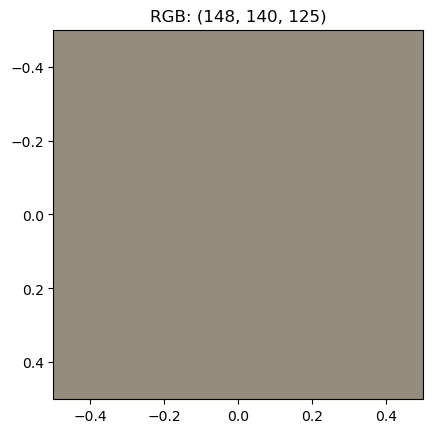

In [99]:
# Displaying the colour
Colour1_prediction = (int(red_pred_1[0].round()), int(green_pred_1[0].round()), int(blue_pred_1[0].round()))
colour1_image = [[Colour1_prediction]]
plt.imshow(colour1_image)
plt.title(f'RGB: {Colour1_prediction}')
plt.show()

In [101]:
# Code to input a column and predict the RGB values for a category based on that column
colour2_pred = []
for i in range(3):
    y = main_df['Colour2'].apply(lambda x: x[i])
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=450)
    colour_model_dt = DecisionTreeRegressor()
    colour_model_dt.fit(X_train, y_train)
    new_X = pd.Series(["Children's Books"])
    new_X_encoded = onehotencoder.transform(pd.DataFrame(new_X))
    new_prediction = colour_model_dt.predict(new_X_encoded)
    colour2_pred.append(int(new_prediction[0].round()))
print(colour2_pred)

[150, 140, 125]


C:\Users\reeth\anaconda3\lib\site-packages\sklearn\base.py:420: UserWarning: X does not have valid feature names, but OneHotEncoder was fitted with feature names
  warnings.warn(
C:\Users\reeth\anaconda3\lib\site-packages\sklearn\base.py:420: UserWarning: X does not have valid feature names, but OneHotEncoder was fitted with feature names
  warnings.warn(
C:\Users\reeth\anaconda3\lib\site-packages\sklearn\base.py:420: UserWarning: X does not have valid feature names, but OneHotEncoder was fitted with feature names
  warnings.warn(


In [102]:
# Code to input a Category and predict the five colours based on each five columns
predicted_top_5_colours = []
for j in range(5):
    column_name = f"Colour{j+1}"
    colour_pred = []
    for i in range(3):
        y = main_df[column_name].apply(lambda x: x[i])
        X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=450)
        colour_model_dt = DecisionTreeRegressor()
        colour_model_dt.fit(X_train, y_train)
        new_X = pd.Series(["Children's Books"])
        new_X_encoded = onehotencoder.transform(pd.DataFrame(new_X))
        new_prediction = colour_model_dt.predict(new_X_encoded)
        colour_pred.append(int(new_prediction[0].round()))
    predicted_top_5_colours.append(colour_pred)

C:\Users\reeth\anaconda3\lib\site-packages\sklearn\base.py:420: UserWarning: X does not have valid feature names, but OneHotEncoder was fitted with feature names
  warnings.warn(
C:\Users\reeth\anaconda3\lib\site-packages\sklearn\base.py:420: UserWarning: X does not have valid feature names, but OneHotEncoder was fitted with feature names
  warnings.warn(
C:\Users\reeth\anaconda3\lib\site-packages\sklearn\base.py:420: UserWarning: X does not have valid feature names, but OneHotEncoder was fitted with feature names
  warnings.warn(
C:\Users\reeth\anaconda3\lib\site-packages\sklearn\base.py:420: UserWarning: X does not have valid feature names, but OneHotEncoder was fitted with feature names
  warnings.warn(
C:\Users\reeth\anaconda3\lib\site-packages\sklearn\base.py:420: UserWarning: X does not have valid feature names, but OneHotEncoder was fitted with feature names
  warnings.warn(
C:\Users\reeth\anaconda3\lib\site-packages\sklearn\base.py:420: UserWarning: X does not have valid featur

In [103]:
predicted_top_5_colours

[[148, 140, 125],
 [150, 140, 125],
 [146, 135, 117],
 [151, 135, 115],
 [145, 132, 115]]

<function matplotlib.pyplot.show(close=None, block=None)>

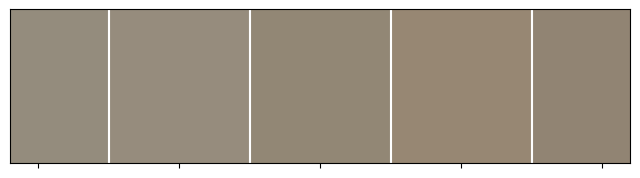

In [110]:
# Displaying all five colours
fig, ax = plt.subplots(1, 1, figsize=(8,2))
for i, colour in enumerate(predicted_top_5_colours):
    ax.axvline(x=i, color=np.array(colour)/255.0, linewidth=100)
ax.set_yticks([])
ax.set_xticks(range(len(predicted_top_5_colours)))
ax.set_xticklabels([])
plt.show

C:\Users\reeth\anaconda3\lib\site-packages\sklearn\base.py:420: UserWarning: X does not have valid feature names, but OneHotEncoder was fitted with feature names
  warnings.warn(
C:\Users\reeth\anaconda3\lib\site-packages\sklearn\base.py:420: UserWarning: X does not have valid feature names, but OneHotEncoder was fitted with feature names
  warnings.warn(
C:\Users\reeth\anaconda3\lib\site-packages\sklearn\base.py:420: UserWarning: X does not have valid feature names, but OneHotEncoder was fitted with feature names
  warnings.warn(
C:\Users\reeth\anaconda3\lib\site-packages\sklearn\base.py:420: UserWarning: X does not have valid feature names, but OneHotEncoder was fitted with feature names
  warnings.warn(
C:\Users\reeth\anaconda3\lib\site-packages\sklearn\base.py:420: UserWarning: X does not have valid feature names, but OneHotEncoder was fitted with feature names
  warnings.warn(
C:\Users\reeth\anaconda3\lib\site-packages\sklearn\base.py:420: UserWarning: X does not have valid featur

[[133, 122, 111], [141, 129, 119], [141, 127, 115], [140, 125, 113], [139, 122, 108]]


C:\Users\reeth\anaconda3\lib\site-packages\sklearn\base.py:420: UserWarning: X does not have valid feature names, but OneHotEncoder was fitted with feature names
  warnings.warn(
C:\Users\reeth\anaconda3\lib\site-packages\sklearn\base.py:420: UserWarning: X does not have valid feature names, but OneHotEncoder was fitted with feature names
  warnings.warn(
C:\Users\reeth\anaconda3\lib\site-packages\sklearn\base.py:420: UserWarning: X does not have valid feature names, but OneHotEncoder was fitted with feature names
  warnings.warn(


<function matplotlib.pyplot.show(close=None, block=None)>

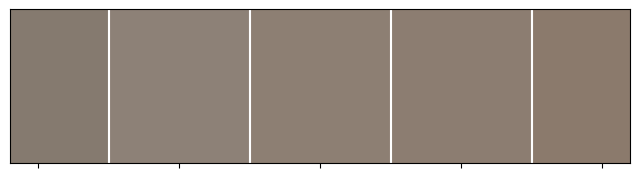

In [206]:
# Trying another category
predicted_top_5_colours = []
for j in range(5):
    column_name = f"Colour{j+1}"
    colour_pred = []
    for i in range(3):
        y = main_df[column_name].apply(lambda x: x[i])
        X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=450)
        colour_model_dt = DecisionTreeRegressor()
        colour_model_dt.fit(X_train, y_train)
        new_X = pd.Series(["History"])
        new_X_encoded = onehotencoder.transform(pd.DataFrame(new_X))
        new_prediction = colour_model_dt.predict(new_X_encoded)
        colour_pred.append(int(new_prediction[0].round()))
    predicted_top_5_colours.append(colour_pred)
print(predicted_top_5_colours)
fig, ax = plt.subplots(1, 1, figsize=(8,2))
for i, colour in enumerate(predicted_top_5_colours):
    ax.axvline(x=i, color=np.array(colour)/255.0, linewidth=100)
ax.set_yticks([])
ax.set_xticks(range(len(predicted_top_5_colours)))
ax.set_xticklabels([])
plt.show

In [191]:
# Getting all the unique categories into a list
categories = main_df['Category'].unique().tolist()
categories

["Children's Books",
 'Sports & Outdoors',
 'Health, Fitness & Dieting',
 'Medical Books',
 'Travel',
 'Business & Money',
 'Cookbooks, Food & Wine',
 'Politics & Social Sciences',
 'Crafts, Hobbies & Home',
 'Religion & Spirituality',
 'Literature & Fiction',
 'Science & Math',
 'Humor & Entertainment',
 'Computers & Technology',
 'Biographies & Memoirs',
 'Arts & Photography',
 'Christian Books & Bibles',
 'Romance',
 'Comics & Graphic Novels',
 'Reference',
 'History',
 'Teen & Young Adult',
 'Parenting & Relationships',
 'Law',
 'Self-Help',
 'Science Fiction & Fantasy',
 'Test Preparation',
 'Engineering & Transportation',
 'Calendars',
 'Mystery, Thriller & Suspense']

C:\Users\reeth\anaconda3\lib\site-packages\sklearn\base.py:420: UserWarning: X does not have valid feature names, but OneHotEncoder was fitted with feature names
  warnings.warn(
C:\Users\reeth\anaconda3\lib\site-packages\sklearn\base.py:420: UserWarning: X does not have valid feature names, but OneHotEncoder was fitted with feature names
  warnings.warn(
C:\Users\reeth\anaconda3\lib\site-packages\sklearn\base.py:420: UserWarning: X does not have valid feature names, but OneHotEncoder was fitted with feature names
  warnings.warn(
C:\Users\reeth\anaconda3\lib\site-packages\sklearn\base.py:420: UserWarning: X does not have valid feature names, but OneHotEncoder was fitted with feature names
  warnings.warn(
C:\Users\reeth\anaconda3\lib\site-packages\sklearn\base.py:420: UserWarning: X does not have valid feature names, but OneHotEncoder was fitted with feature names
  warnings.warn(
C:\Users\reeth\anaconda3\lib\site-packages\sklearn\base.py:420: UserWarning: X does not have valid featur

Children's Books
[[150, 142, 127], [150, 139, 123], [146, 134, 116], [149, 133, 114], [146, 133, 116]]


C:\Users\reeth\anaconda3\lib\site-packages\sklearn\base.py:420: UserWarning: X does not have valid feature names, but OneHotEncoder was fitted with feature names
  warnings.warn(
C:\Users\reeth\anaconda3\lib\site-packages\sklearn\base.py:420: UserWarning: X does not have valid feature names, but OneHotEncoder was fitted with feature names
  warnings.warn(
C:\Users\reeth\anaconda3\lib\site-packages\sklearn\base.py:420: UserWarning: X does not have valid feature names, but OneHotEncoder was fitted with feature names
  warnings.warn(
C:\Users\reeth\anaconda3\lib\site-packages\sklearn\base.py:420: UserWarning: X does not have valid feature names, but OneHotEncoder was fitted with feature names
  warnings.warn(
C:\Users\reeth\anaconda3\lib\site-packages\sklearn\base.py:420: UserWarning: X does not have valid feature names, but OneHotEncoder was fitted with feature names
  warnings.warn(
C:\Users\reeth\anaconda3\lib\site-packages\sklearn\base.py:420: UserWarning: X does not have valid featur

Sports & Outdoors
[[132, 123, 117], [141, 134, 124], [142, 129, 117], [135, 123, 113], [141, 126, 114]]


C:\Users\reeth\anaconda3\lib\site-packages\sklearn\base.py:420: UserWarning: X does not have valid feature names, but OneHotEncoder was fitted with feature names
  warnings.warn(
C:\Users\reeth\anaconda3\lib\site-packages\sklearn\base.py:420: UserWarning: X does not have valid feature names, but OneHotEncoder was fitted with feature names
  warnings.warn(
C:\Users\reeth\anaconda3\lib\site-packages\sklearn\base.py:420: UserWarning: X does not have valid feature names, but OneHotEncoder was fitted with feature names
  warnings.warn(
C:\Users\reeth\anaconda3\lib\site-packages\sklearn\base.py:420: UserWarning: X does not have valid feature names, but OneHotEncoder was fitted with feature names
  warnings.warn(
C:\Users\reeth\anaconda3\lib\site-packages\sklearn\base.py:420: UserWarning: X does not have valid feature names, but OneHotEncoder was fitted with feature names
  warnings.warn(
C:\Users\reeth\anaconda3\lib\site-packages\sklearn\base.py:420: UserWarning: X does not have valid featur

Health, Fitness & Dieting
[[161, 149, 137], [151, 137, 127], [148, 131, 119], [150, 131, 117], [148, 132, 119]]


C:\Users\reeth\anaconda3\lib\site-packages\sklearn\base.py:420: UserWarning: X does not have valid feature names, but OneHotEncoder was fitted with feature names
  warnings.warn(
C:\Users\reeth\anaconda3\lib\site-packages\sklearn\base.py:420: UserWarning: X does not have valid feature names, but OneHotEncoder was fitted with feature names
  warnings.warn(
C:\Users\reeth\anaconda3\lib\site-packages\sklearn\base.py:420: UserWarning: X does not have valid feature names, but OneHotEncoder was fitted with feature names
  warnings.warn(
C:\Users\reeth\anaconda3\lib\site-packages\sklearn\base.py:420: UserWarning: X does not have valid feature names, but OneHotEncoder was fitted with feature names
  warnings.warn(
C:\Users\reeth\anaconda3\lib\site-packages\sklearn\base.py:420: UserWarning: X does not have valid feature names, but OneHotEncoder was fitted with feature names
  warnings.warn(
C:\Users\reeth\anaconda3\lib\site-packages\sklearn\base.py:420: UserWarning: X does not have valid featur

Medical Books
[[141, 135, 130], [144, 140, 135], [145, 133, 123], [138, 126, 122], [141, 130, 120]]


C:\Users\reeth\anaconda3\lib\site-packages\sklearn\base.py:420: UserWarning: X does not have valid feature names, but OneHotEncoder was fitted with feature names
  warnings.warn(
C:\Users\reeth\anaconda3\lib\site-packages\sklearn\base.py:420: UserWarning: X does not have valid feature names, but OneHotEncoder was fitted with feature names
  warnings.warn(
C:\Users\reeth\anaconda3\lib\site-packages\sklearn\base.py:420: UserWarning: X does not have valid feature names, but OneHotEncoder was fitted with feature names
  warnings.warn(
C:\Users\reeth\anaconda3\lib\site-packages\sklearn\base.py:420: UserWarning: X does not have valid feature names, but OneHotEncoder was fitted with feature names
  warnings.warn(
C:\Users\reeth\anaconda3\lib\site-packages\sklearn\base.py:420: UserWarning: X does not have valid feature names, but OneHotEncoder was fitted with feature names
  warnings.warn(
C:\Users\reeth\anaconda3\lib\site-packages\sklearn\base.py:420: UserWarning: X does not have valid featur

Travel
[[134, 127, 115], [145, 139, 129], [141, 131, 117], [135, 125, 114], [140, 129, 116]]


C:\Users\reeth\anaconda3\lib\site-packages\sklearn\base.py:420: UserWarning: X does not have valid feature names, but OneHotEncoder was fitted with feature names
  warnings.warn(
C:\Users\reeth\anaconda3\lib\site-packages\sklearn\base.py:420: UserWarning: X does not have valid feature names, but OneHotEncoder was fitted with feature names
  warnings.warn(
C:\Users\reeth\anaconda3\lib\site-packages\sklearn\base.py:420: UserWarning: X does not have valid feature names, but OneHotEncoder was fitted with feature names
  warnings.warn(
C:\Users\reeth\anaconda3\lib\site-packages\sklearn\base.py:420: UserWarning: X does not have valid feature names, but OneHotEncoder was fitted with feature names
  warnings.warn(
C:\Users\reeth\anaconda3\lib\site-packages\sklearn\base.py:420: UserWarning: X does not have valid feature names, but OneHotEncoder was fitted with feature names
  warnings.warn(
C:\Users\reeth\anaconda3\lib\site-packages\sklearn\base.py:420: UserWarning: X does not have valid featur

Business & Money
[[143, 138, 129], [139, 132, 123], [145, 133, 121], [133, 125, 115], [142, 130, 118]]


C:\Users\reeth\anaconda3\lib\site-packages\sklearn\base.py:420: UserWarning: X does not have valid feature names, but OneHotEncoder was fitted with feature names
  warnings.warn(
C:\Users\reeth\anaconda3\lib\site-packages\sklearn\base.py:420: UserWarning: X does not have valid feature names, but OneHotEncoder was fitted with feature names
  warnings.warn(
C:\Users\reeth\anaconda3\lib\site-packages\sklearn\base.py:420: UserWarning: X does not have valid feature names, but OneHotEncoder was fitted with feature names
  warnings.warn(
C:\Users\reeth\anaconda3\lib\site-packages\sklearn\base.py:420: UserWarning: X does not have valid feature names, but OneHotEncoder was fitted with feature names
  warnings.warn(
C:\Users\reeth\anaconda3\lib\site-packages\sklearn\base.py:420: UserWarning: X does not have valid feature names, but OneHotEncoder was fitted with feature names
  warnings.warn(
C:\Users\reeth\anaconda3\lib\site-packages\sklearn\base.py:420: UserWarning: X does not have valid featur

Cookbooks, Food & Wine
[[160, 142, 121], [157, 137, 117], [156, 132, 109], [153, 128, 105], [158, 133, 108]]


C:\Users\reeth\anaconda3\lib\site-packages\sklearn\base.py:420: UserWarning: X does not have valid feature names, but OneHotEncoder was fitted with feature names
  warnings.warn(
C:\Users\reeth\anaconda3\lib\site-packages\sklearn\base.py:420: UserWarning: X does not have valid feature names, but OneHotEncoder was fitted with feature names
  warnings.warn(
C:\Users\reeth\anaconda3\lib\site-packages\sklearn\base.py:420: UserWarning: X does not have valid feature names, but OneHotEncoder was fitted with feature names
  warnings.warn(
C:\Users\reeth\anaconda3\lib\site-packages\sklearn\base.py:420: UserWarning: X does not have valid feature names, but OneHotEncoder was fitted with feature names
  warnings.warn(
C:\Users\reeth\anaconda3\lib\site-packages\sklearn\base.py:420: UserWarning: X does not have valid feature names, but OneHotEncoder was fitted with feature names
  warnings.warn(
C:\Users\reeth\anaconda3\lib\site-packages\sklearn\base.py:420: UserWarning: X does not have valid featur

Politics & Social Sciences
[[139, 128, 118], [141, 130, 120], [145, 130, 116], [143, 127, 114], [144, 130, 115]]


C:\Users\reeth\anaconda3\lib\site-packages\sklearn\base.py:420: UserWarning: X does not have valid feature names, but OneHotEncoder was fitted with feature names
  warnings.warn(
C:\Users\reeth\anaconda3\lib\site-packages\sklearn\base.py:420: UserWarning: X does not have valid feature names, but OneHotEncoder was fitted with feature names
  warnings.warn(
C:\Users\reeth\anaconda3\lib\site-packages\sklearn\base.py:420: UserWarning: X does not have valid feature names, but OneHotEncoder was fitted with feature names
  warnings.warn(
C:\Users\reeth\anaconda3\lib\site-packages\sklearn\base.py:420: UserWarning: X does not have valid feature names, but OneHotEncoder was fitted with feature names
  warnings.warn(
C:\Users\reeth\anaconda3\lib\site-packages\sklearn\base.py:420: UserWarning: X does not have valid feature names, but OneHotEncoder was fitted with feature names
  warnings.warn(
C:\Users\reeth\anaconda3\lib\site-packages\sklearn\base.py:420: UserWarning: X does not have valid featur

Crafts, Hobbies & Home
[[146, 135, 120], [148, 136, 123], [143, 127, 112], [144, 130, 115], [147, 130, 113]]


C:\Users\reeth\anaconda3\lib\site-packages\sklearn\base.py:420: UserWarning: X does not have valid feature names, but OneHotEncoder was fitted with feature names
  warnings.warn(
C:\Users\reeth\anaconda3\lib\site-packages\sklearn\base.py:420: UserWarning: X does not have valid feature names, but OneHotEncoder was fitted with feature names
  warnings.warn(
C:\Users\reeth\anaconda3\lib\site-packages\sklearn\base.py:420: UserWarning: X does not have valid feature names, but OneHotEncoder was fitted with feature names
  warnings.warn(
C:\Users\reeth\anaconda3\lib\site-packages\sklearn\base.py:420: UserWarning: X does not have valid feature names, but OneHotEncoder was fitted with feature names
  warnings.warn(
C:\Users\reeth\anaconda3\lib\site-packages\sklearn\base.py:420: UserWarning: X does not have valid feature names, but OneHotEncoder was fitted with feature names
  warnings.warn(
C:\Users\reeth\anaconda3\lib\site-packages\sklearn\base.py:420: UserWarning: X does not have valid featur

Religion & Spirituality
[[147, 135, 122], [142, 129, 117], [145, 130, 116], [140, 126, 112], [146, 130, 115]]


C:\Users\reeth\anaconda3\lib\site-packages\sklearn\base.py:420: UserWarning: X does not have valid feature names, but OneHotEncoder was fitted with feature names
  warnings.warn(
C:\Users\reeth\anaconda3\lib\site-packages\sklearn\base.py:420: UserWarning: X does not have valid feature names, but OneHotEncoder was fitted with feature names
  warnings.warn(
C:\Users\reeth\anaconda3\lib\site-packages\sklearn\base.py:420: UserWarning: X does not have valid feature names, but OneHotEncoder was fitted with feature names
  warnings.warn(
C:\Users\reeth\anaconda3\lib\site-packages\sklearn\base.py:420: UserWarning: X does not have valid feature names, but OneHotEncoder was fitted with feature names
  warnings.warn(
C:\Users\reeth\anaconda3\lib\site-packages\sklearn\base.py:420: UserWarning: X does not have valid feature names, but OneHotEncoder was fitted with feature names
  warnings.warn(
C:\Users\reeth\anaconda3\lib\site-packages\sklearn\base.py:420: UserWarning: X does not have valid featur

Literature & Fiction
[[136, 123, 112], [143, 128, 114], [141, 127, 113], [144, 128, 112], [144, 127, 110]]


C:\Users\reeth\anaconda3\lib\site-packages\sklearn\base.py:420: UserWarning: X does not have valid feature names, but OneHotEncoder was fitted with feature names
  warnings.warn(
C:\Users\reeth\anaconda3\lib\site-packages\sklearn\base.py:420: UserWarning: X does not have valid feature names, but OneHotEncoder was fitted with feature names
  warnings.warn(
C:\Users\reeth\anaconda3\lib\site-packages\sklearn\base.py:420: UserWarning: X does not have valid feature names, but OneHotEncoder was fitted with feature names
  warnings.warn(
C:\Users\reeth\anaconda3\lib\site-packages\sklearn\base.py:420: UserWarning: X does not have valid feature names, but OneHotEncoder was fitted with feature names
  warnings.warn(
C:\Users\reeth\anaconda3\lib\site-packages\sklearn\base.py:420: UserWarning: X does not have valid feature names, but OneHotEncoder was fitted with feature names
  warnings.warn(
C:\Users\reeth\anaconda3\lib\site-packages\sklearn\base.py:420: UserWarning: X does not have valid featur

Science & Math
[[127, 123, 113], [143, 137, 127], [138, 129, 119], [136, 127, 114], [134, 128, 116]]


C:\Users\reeth\anaconda3\lib\site-packages\sklearn\base.py:420: UserWarning: X does not have valid feature names, but OneHotEncoder was fitted with feature names
  warnings.warn(
C:\Users\reeth\anaconda3\lib\site-packages\sklearn\base.py:420: UserWarning: X does not have valid feature names, but OneHotEncoder was fitted with feature names
  warnings.warn(
C:\Users\reeth\anaconda3\lib\site-packages\sklearn\base.py:420: UserWarning: X does not have valid feature names, but OneHotEncoder was fitted with feature names
  warnings.warn(
C:\Users\reeth\anaconda3\lib\site-packages\sklearn\base.py:420: UserWarning: X does not have valid feature names, but OneHotEncoder was fitted with feature names
  warnings.warn(
C:\Users\reeth\anaconda3\lib\site-packages\sklearn\base.py:420: UserWarning: X does not have valid feature names, but OneHotEncoder was fitted with feature names
  warnings.warn(
C:\Users\reeth\anaconda3\lib\site-packages\sklearn\base.py:420: UserWarning: X does not have valid featur

Humor & Entertainment
[[141, 128, 117], [146, 135, 122], [146, 126, 113], [145, 127, 112], [147, 127, 111]]


C:\Users\reeth\anaconda3\lib\site-packages\sklearn\base.py:420: UserWarning: X does not have valid feature names, but OneHotEncoder was fitted with feature names
  warnings.warn(
C:\Users\reeth\anaconda3\lib\site-packages\sklearn\base.py:420: UserWarning: X does not have valid feature names, but OneHotEncoder was fitted with feature names
  warnings.warn(
C:\Users\reeth\anaconda3\lib\site-packages\sklearn\base.py:420: UserWarning: X does not have valid feature names, but OneHotEncoder was fitted with feature names
  warnings.warn(
C:\Users\reeth\anaconda3\lib\site-packages\sklearn\base.py:420: UserWarning: X does not have valid feature names, but OneHotEncoder was fitted with feature names
  warnings.warn(
C:\Users\reeth\anaconda3\lib\site-packages\sklearn\base.py:420: UserWarning: X does not have valid feature names, but OneHotEncoder was fitted with feature names
  warnings.warn(
C:\Users\reeth\anaconda3\lib\site-packages\sklearn\base.py:420: UserWarning: X does not have valid featur

Computers & Technology
[[147, 145, 135], [138, 138, 128], [141, 130, 116], [141, 132, 119], [138, 130, 119]]


C:\Users\reeth\anaconda3\lib\site-packages\sklearn\base.py:420: UserWarning: X does not have valid feature names, but OneHotEncoder was fitted with feature names
  warnings.warn(
C:\Users\reeth\anaconda3\lib\site-packages\sklearn\base.py:420: UserWarning: X does not have valid feature names, but OneHotEncoder was fitted with feature names
  warnings.warn(
C:\Users\reeth\anaconda3\lib\site-packages\sklearn\base.py:420: UserWarning: X does not have valid feature names, but OneHotEncoder was fitted with feature names
  warnings.warn(
C:\Users\reeth\anaconda3\lib\site-packages\sklearn\base.py:420: UserWarning: X does not have valid feature names, but OneHotEncoder was fitted with feature names
  warnings.warn(
C:\Users\reeth\anaconda3\lib\site-packages\sklearn\base.py:420: UserWarning: X does not have valid feature names, but OneHotEncoder was fitted with feature names
  warnings.warn(
C:\Users\reeth\anaconda3\lib\site-packages\sklearn\base.py:420: UserWarning: X does not have valid featur

Biographies & Memoirs
[[137, 125, 114], [138, 126, 117], [143, 124, 112], [143, 124, 110], [144, 125, 112]]


C:\Users\reeth\anaconda3\lib\site-packages\sklearn\base.py:420: UserWarning: X does not have valid feature names, but OneHotEncoder was fitted with feature names
  warnings.warn(
C:\Users\reeth\anaconda3\lib\site-packages\sklearn\base.py:420: UserWarning: X does not have valid feature names, but OneHotEncoder was fitted with feature names
  warnings.warn(
C:\Users\reeth\anaconda3\lib\site-packages\sklearn\base.py:420: UserWarning: X does not have valid feature names, but OneHotEncoder was fitted with feature names
  warnings.warn(
C:\Users\reeth\anaconda3\lib\site-packages\sklearn\base.py:420: UserWarning: X does not have valid feature names, but OneHotEncoder was fitted with feature names
  warnings.warn(
C:\Users\reeth\anaconda3\lib\site-packages\sklearn\base.py:420: UserWarning: X does not have valid feature names, but OneHotEncoder was fitted with feature names
  warnings.warn(
C:\Users\reeth\anaconda3\lib\site-packages\sklearn\base.py:420: UserWarning: X does not have valid featur

Arts & Photography
[[141, 130, 121], [140, 129, 120], [143, 130, 120], [138, 124, 113], [144, 129, 117]]


C:\Users\reeth\anaconda3\lib\site-packages\sklearn\base.py:420: UserWarning: X does not have valid feature names, but OneHotEncoder was fitted with feature names
  warnings.warn(
C:\Users\reeth\anaconda3\lib\site-packages\sklearn\base.py:420: UserWarning: X does not have valid feature names, but OneHotEncoder was fitted with feature names
  warnings.warn(
C:\Users\reeth\anaconda3\lib\site-packages\sklearn\base.py:420: UserWarning: X does not have valid feature names, but OneHotEncoder was fitted with feature names
  warnings.warn(
C:\Users\reeth\anaconda3\lib\site-packages\sklearn\base.py:420: UserWarning: X does not have valid feature names, but OneHotEncoder was fitted with feature names
  warnings.warn(
C:\Users\reeth\anaconda3\lib\site-packages\sklearn\base.py:420: UserWarning: X does not have valid feature names, but OneHotEncoder was fitted with feature names
  warnings.warn(
C:\Users\reeth\anaconda3\lib\site-packages\sklearn\base.py:420: UserWarning: X does not have valid featur

Christian Books & Bibles
[[139, 128, 116], [147, 133, 121], [143, 128, 115], [139, 125, 111], [143, 130, 115]]


C:\Users\reeth\anaconda3\lib\site-packages\sklearn\base.py:420: UserWarning: X does not have valid feature names, but OneHotEncoder was fitted with feature names
  warnings.warn(
C:\Users\reeth\anaconda3\lib\site-packages\sklearn\base.py:420: UserWarning: X does not have valid feature names, but OneHotEncoder was fitted with feature names
  warnings.warn(
C:\Users\reeth\anaconda3\lib\site-packages\sklearn\base.py:420: UserWarning: X does not have valid feature names, but OneHotEncoder was fitted with feature names
  warnings.warn(
C:\Users\reeth\anaconda3\lib\site-packages\sklearn\base.py:420: UserWarning: X does not have valid feature names, but OneHotEncoder was fitted with feature names
  warnings.warn(
C:\Users\reeth\anaconda3\lib\site-packages\sklearn\base.py:420: UserWarning: X does not have valid feature names, but OneHotEncoder was fitted with feature names
  warnings.warn(
C:\Users\reeth\anaconda3\lib\site-packages\sklearn\base.py:420: UserWarning: X does not have valid featur

Romance
[[124, 106, 98], [137, 120, 111], [139, 121, 111], [140, 119, 110], [141, 120, 109]]


C:\Users\reeth\anaconda3\lib\site-packages\sklearn\base.py:420: UserWarning: X does not have valid feature names, but OneHotEncoder was fitted with feature names
  warnings.warn(
C:\Users\reeth\anaconda3\lib\site-packages\sklearn\base.py:420: UserWarning: X does not have valid feature names, but OneHotEncoder was fitted with feature names
  warnings.warn(
C:\Users\reeth\anaconda3\lib\site-packages\sklearn\base.py:420: UserWarning: X does not have valid feature names, but OneHotEncoder was fitted with feature names
  warnings.warn(
C:\Users\reeth\anaconda3\lib\site-packages\sklearn\base.py:420: UserWarning: X does not have valid feature names, but OneHotEncoder was fitted with feature names
  warnings.warn(
C:\Users\reeth\anaconda3\lib\site-packages\sklearn\base.py:420: UserWarning: X does not have valid feature names, but OneHotEncoder was fitted with feature names
  warnings.warn(
C:\Users\reeth\anaconda3\lib\site-packages\sklearn\base.py:420: UserWarning: X does not have valid featur

Comics & Graphic Novels
[[147, 132, 119], [143, 127, 116], [148, 130, 117], [142, 123, 109], [147, 128, 113]]


C:\Users\reeth\anaconda3\lib\site-packages\sklearn\base.py:420: UserWarning: X does not have valid feature names, but OneHotEncoder was fitted with feature names
  warnings.warn(
C:\Users\reeth\anaconda3\lib\site-packages\sklearn\base.py:420: UserWarning: X does not have valid feature names, but OneHotEncoder was fitted with feature names
  warnings.warn(
C:\Users\reeth\anaconda3\lib\site-packages\sklearn\base.py:420: UserWarning: X does not have valid feature names, but OneHotEncoder was fitted with feature names
  warnings.warn(
C:\Users\reeth\anaconda3\lib\site-packages\sklearn\base.py:420: UserWarning: X does not have valid feature names, but OneHotEncoder was fitted with feature names
  warnings.warn(
C:\Users\reeth\anaconda3\lib\site-packages\sklearn\base.py:420: UserWarning: X does not have valid feature names, but OneHotEncoder was fitted with feature names
  warnings.warn(
C:\Users\reeth\anaconda3\lib\site-packages\sklearn\base.py:420: UserWarning: X does not have valid featur

Reference
[[148, 136, 126], [149, 138, 124], [150, 134, 119], [143, 128, 116], [148, 132, 117]]


C:\Users\reeth\anaconda3\lib\site-packages\sklearn\base.py:420: UserWarning: X does not have valid feature names, but OneHotEncoder was fitted with feature names
  warnings.warn(
C:\Users\reeth\anaconda3\lib\site-packages\sklearn\base.py:420: UserWarning: X does not have valid feature names, but OneHotEncoder was fitted with feature names
  warnings.warn(
C:\Users\reeth\anaconda3\lib\site-packages\sklearn\base.py:420: UserWarning: X does not have valid feature names, but OneHotEncoder was fitted with feature names
  warnings.warn(
C:\Users\reeth\anaconda3\lib\site-packages\sklearn\base.py:420: UserWarning: X does not have valid feature names, but OneHotEncoder was fitted with feature names
  warnings.warn(
C:\Users\reeth\anaconda3\lib\site-packages\sklearn\base.py:420: UserWarning: X does not have valid feature names, but OneHotEncoder was fitted with feature names
  warnings.warn(
C:\Users\reeth\anaconda3\lib\site-packages\sklearn\base.py:420: UserWarning: X does not have valid featur

History
[[133, 122, 111], [141, 129, 119], [141, 127, 115], [140, 125, 113], [139, 122, 108]]


C:\Users\reeth\anaconda3\lib\site-packages\sklearn\base.py:420: UserWarning: X does not have valid feature names, but OneHotEncoder was fitted with feature names
  warnings.warn(
C:\Users\reeth\anaconda3\lib\site-packages\sklearn\base.py:420: UserWarning: X does not have valid feature names, but OneHotEncoder was fitted with feature names
  warnings.warn(
C:\Users\reeth\anaconda3\lib\site-packages\sklearn\base.py:420: UserWarning: X does not have valid feature names, but OneHotEncoder was fitted with feature names
  warnings.warn(
C:\Users\reeth\anaconda3\lib\site-packages\sklearn\base.py:420: UserWarning: X does not have valid feature names, but OneHotEncoder was fitted with feature names
  warnings.warn(
C:\Users\reeth\anaconda3\lib\site-packages\sklearn\base.py:420: UserWarning: X does not have valid feature names, but OneHotEncoder was fitted with feature names
  warnings.warn(
C:\Users\reeth\anaconda3\lib\site-packages\sklearn\base.py:420: UserWarning: X does not have valid featur

Teen & Young Adult
[[133, 122, 114], [140, 129, 117], [144, 129, 117], [140, 124, 112], [143, 127, 115]]


C:\Users\reeth\anaconda3\lib\site-packages\sklearn\base.py:420: UserWarning: X does not have valid feature names, but OneHotEncoder was fitted with feature names
  warnings.warn(
C:\Users\reeth\anaconda3\lib\site-packages\sklearn\base.py:420: UserWarning: X does not have valid feature names, but OneHotEncoder was fitted with feature names
  warnings.warn(
C:\Users\reeth\anaconda3\lib\site-packages\sklearn\base.py:420: UserWarning: X does not have valid feature names, but OneHotEncoder was fitted with feature names
  warnings.warn(
C:\Users\reeth\anaconda3\lib\site-packages\sklearn\base.py:420: UserWarning: X does not have valid feature names, but OneHotEncoder was fitted with feature names
  warnings.warn(
C:\Users\reeth\anaconda3\lib\site-packages\sklearn\base.py:420: UserWarning: X does not have valid feature names, but OneHotEncoder was fitted with feature names
  warnings.warn(
C:\Users\reeth\anaconda3\lib\site-packages\sklearn\base.py:420: UserWarning: X does not have valid featur

Parenting & Relationships
[[168, 157, 147], [157, 145, 134], [148, 135, 124], [153, 134, 119], [153, 139, 126]]


C:\Users\reeth\anaconda3\lib\site-packages\sklearn\base.py:420: UserWarning: X does not have valid feature names, but OneHotEncoder was fitted with feature names
  warnings.warn(
C:\Users\reeth\anaconda3\lib\site-packages\sklearn\base.py:420: UserWarning: X does not have valid feature names, but OneHotEncoder was fitted with feature names
  warnings.warn(
C:\Users\reeth\anaconda3\lib\site-packages\sklearn\base.py:420: UserWarning: X does not have valid feature names, but OneHotEncoder was fitted with feature names
  warnings.warn(
C:\Users\reeth\anaconda3\lib\site-packages\sklearn\base.py:420: UserWarning: X does not have valid feature names, but OneHotEncoder was fitted with feature names
  warnings.warn(
C:\Users\reeth\anaconda3\lib\site-packages\sklearn\base.py:420: UserWarning: X does not have valid feature names, but OneHotEncoder was fitted with feature names
  warnings.warn(
C:\Users\reeth\anaconda3\lib\site-packages\sklearn\base.py:420: UserWarning: X does not have valid featur

Law
[[138, 130, 122], [138, 132, 123], [144, 131, 121], [136, 124, 114], [135, 124, 114]]


C:\Users\reeth\anaconda3\lib\site-packages\sklearn\base.py:420: UserWarning: X does not have valid feature names, but OneHotEncoder was fitted with feature names
  warnings.warn(
C:\Users\reeth\anaconda3\lib\site-packages\sklearn\base.py:420: UserWarning: X does not have valid feature names, but OneHotEncoder was fitted with feature names
  warnings.warn(
C:\Users\reeth\anaconda3\lib\site-packages\sklearn\base.py:420: UserWarning: X does not have valid feature names, but OneHotEncoder was fitted with feature names
  warnings.warn(
C:\Users\reeth\anaconda3\lib\site-packages\sklearn\base.py:420: UserWarning: X does not have valid feature names, but OneHotEncoder was fitted with feature names
  warnings.warn(
C:\Users\reeth\anaconda3\lib\site-packages\sklearn\base.py:420: UserWarning: X does not have valid feature names, but OneHotEncoder was fitted with feature names
  warnings.warn(
C:\Users\reeth\anaconda3\lib\site-packages\sklearn\base.py:420: UserWarning: X does not have valid featur

Self-Help
[[164, 150, 141], [150, 138, 127], [155, 138, 125], [148, 131, 119], [151, 136, 123]]


C:\Users\reeth\anaconda3\lib\site-packages\sklearn\base.py:420: UserWarning: X does not have valid feature names, but OneHotEncoder was fitted with feature names
  warnings.warn(
C:\Users\reeth\anaconda3\lib\site-packages\sklearn\base.py:420: UserWarning: X does not have valid feature names, but OneHotEncoder was fitted with feature names
  warnings.warn(
C:\Users\reeth\anaconda3\lib\site-packages\sklearn\base.py:420: UserWarning: X does not have valid feature names, but OneHotEncoder was fitted with feature names
  warnings.warn(
C:\Users\reeth\anaconda3\lib\site-packages\sklearn\base.py:420: UserWarning: X does not have valid feature names, but OneHotEncoder was fitted with feature names
  warnings.warn(
C:\Users\reeth\anaconda3\lib\site-packages\sklearn\base.py:420: UserWarning: X does not have valid feature names, but OneHotEncoder was fitted with feature names
  warnings.warn(
C:\Users\reeth\anaconda3\lib\site-packages\sklearn\base.py:420: UserWarning: X does not have valid featur

Science Fiction & Fantasy
[[110, 101, 93], [132, 122, 110], [136, 124, 113], [132, 119, 106], [134, 119, 106]]


C:\Users\reeth\anaconda3\lib\site-packages\sklearn\base.py:420: UserWarning: X does not have valid feature names, but OneHotEncoder was fitted with feature names
  warnings.warn(
C:\Users\reeth\anaconda3\lib\site-packages\sklearn\base.py:420: UserWarning: X does not have valid feature names, but OneHotEncoder was fitted with feature names
  warnings.warn(
C:\Users\reeth\anaconda3\lib\site-packages\sklearn\base.py:420: UserWarning: X does not have valid feature names, but OneHotEncoder was fitted with feature names
  warnings.warn(
C:\Users\reeth\anaconda3\lib\site-packages\sklearn\base.py:420: UserWarning: X does not have valid feature names, but OneHotEncoder was fitted with feature names
  warnings.warn(
C:\Users\reeth\anaconda3\lib\site-packages\sklearn\base.py:420: UserWarning: X does not have valid feature names, but OneHotEncoder was fitted with feature names
  warnings.warn(
C:\Users\reeth\anaconda3\lib\site-packages\sklearn\base.py:420: UserWarning: X does not have valid featur

Test Preparation
[[145, 142, 137], [154, 150, 145], [147, 132, 120], [142, 130, 119], [149, 136, 122]]


C:\Users\reeth\anaconda3\lib\site-packages\sklearn\base.py:420: UserWarning: X does not have valid feature names, but OneHotEncoder was fitted with feature names
  warnings.warn(
C:\Users\reeth\anaconda3\lib\site-packages\sklearn\base.py:420: UserWarning: X does not have valid feature names, but OneHotEncoder was fitted with feature names
  warnings.warn(
C:\Users\reeth\anaconda3\lib\site-packages\sklearn\base.py:420: UserWarning: X does not have valid feature names, but OneHotEncoder was fitted with feature names
  warnings.warn(
C:\Users\reeth\anaconda3\lib\site-packages\sklearn\base.py:420: UserWarning: X does not have valid feature names, but OneHotEncoder was fitted with feature names
  warnings.warn(
C:\Users\reeth\anaconda3\lib\site-packages\sklearn\base.py:420: UserWarning: X does not have valid feature names, but OneHotEncoder was fitted with feature names
  warnings.warn(
C:\Users\reeth\anaconda3\lib\site-packages\sklearn\base.py:420: UserWarning: X does not have valid featur

Engineering & Transportation
[[132, 126, 120], [139, 134, 126], [140, 128, 118], [136, 124, 115], [143, 130, 115]]


C:\Users\reeth\anaconda3\lib\site-packages\sklearn\base.py:420: UserWarning: X does not have valid feature names, but OneHotEncoder was fitted with feature names
  warnings.warn(
C:\Users\reeth\anaconda3\lib\site-packages\sklearn\base.py:420: UserWarning: X does not have valid feature names, but OneHotEncoder was fitted with feature names
  warnings.warn(
C:\Users\reeth\anaconda3\lib\site-packages\sklearn\base.py:420: UserWarning: X does not have valid feature names, but OneHotEncoder was fitted with feature names
  warnings.warn(
C:\Users\reeth\anaconda3\lib\site-packages\sklearn\base.py:420: UserWarning: X does not have valid feature names, but OneHotEncoder was fitted with feature names
  warnings.warn(
C:\Users\reeth\anaconda3\lib\site-packages\sklearn\base.py:420: UserWarning: X does not have valid feature names, but OneHotEncoder was fitted with feature names
  warnings.warn(
C:\Users\reeth\anaconda3\lib\site-packages\sklearn\base.py:420: UserWarning: X does not have valid featur

Calendars
[[140, 129, 117], [143, 132, 120], [146, 132, 117], [140, 127, 112], [146, 132, 118]]


C:\Users\reeth\anaconda3\lib\site-packages\sklearn\base.py:420: UserWarning: X does not have valid feature names, but OneHotEncoder was fitted with feature names
  warnings.warn(
C:\Users\reeth\anaconda3\lib\site-packages\sklearn\base.py:420: UserWarning: X does not have valid feature names, but OneHotEncoder was fitted with feature names
  warnings.warn(
C:\Users\reeth\anaconda3\lib\site-packages\sklearn\base.py:420: UserWarning: X does not have valid feature names, but OneHotEncoder was fitted with feature names
  warnings.warn(
C:\Users\reeth\anaconda3\lib\site-packages\sklearn\base.py:420: UserWarning: X does not have valid feature names, but OneHotEncoder was fitted with feature names
  warnings.warn(
C:\Users\reeth\anaconda3\lib\site-packages\sklearn\base.py:420: UserWarning: X does not have valid feature names, but OneHotEncoder was fitted with feature names
  warnings.warn(
C:\Users\reeth\anaconda3\lib\site-packages\sklearn\base.py:420: UserWarning: X does not have valid featur

Mystery, Thriller & Suspense
[[124, 110, 100], [136, 125, 114], [136, 119, 107], [141, 122, 109], [142, 124, 110]]


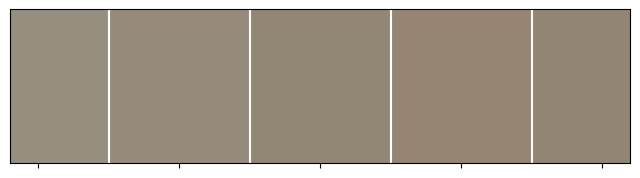

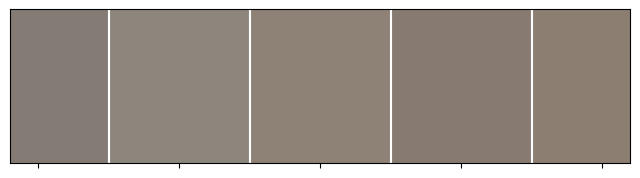

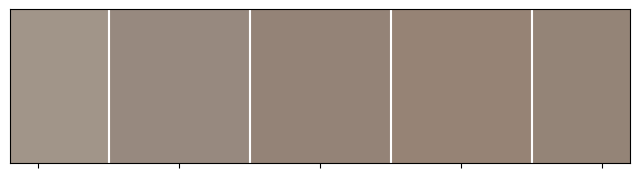

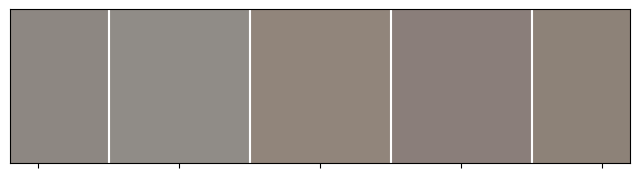

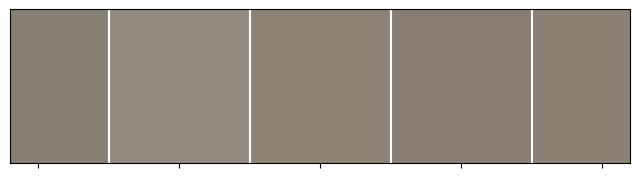

...

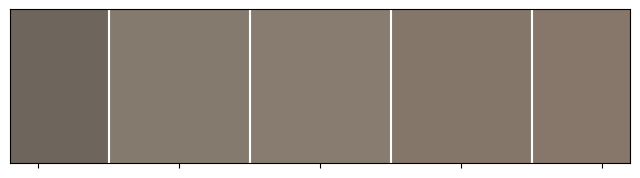

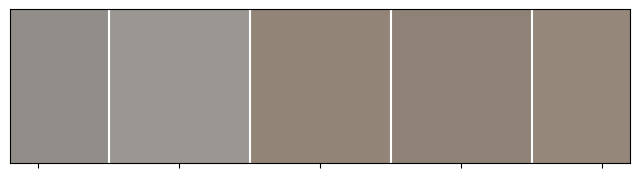

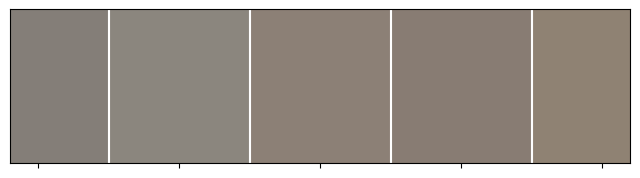

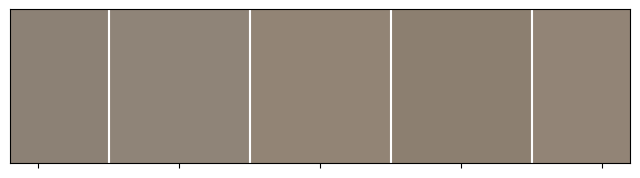

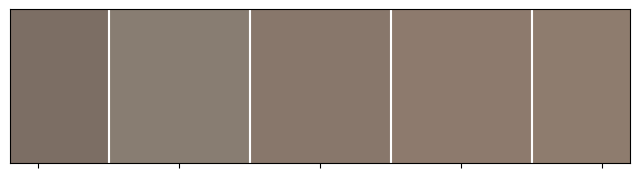

In [209]:
for category in categories:
    predicted_top_5_colours = []
    for j in range(5):
        column_name = f"Colour{j+1}"
        colour_pred = []
        for i in range(3):
            y = main_df[column_name].apply(lambda x: x[i])
            X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=450)
            colour_model_dt = DecisionTreeRegressor()
            colour_model_dt.fit(X_train, y_train)
            new_X = pd.Series([category])
            new_X_encoded = onehotencoder.transform(pd.DataFrame(new_X))
            new_prediction = colour_model_dt.predict(new_X_encoded)
            colour_pred.append(int(new_prediction[0].round()))
        predicted_top_5_colours.append(colour_pred)
    print(category)
    print(predicted_top_5_colours)
    fig, ax = plt.subplots(1, 1, figsize=(8,2))
    for i, colour in enumerate(predicted_top_5_colours):
        ax.axvline(x=i, color=np.array(colour)/255.0, linewidth=100)
    ax.set_yticks([])
    ax.set_xticks(range(len(predicted_top_5_colours)))
    ax.set_xticklabels([])
    plt.show

Regardless of the category, the output is very similar in colour. We can now try another form for colour representation.

HSL (Hue, Saturation, Lightness) values of colours are a different way of representing colours. We will now convert the RGB colours into their HSL values and train the models with those values.

In [112]:
# Function to convert RGB to HSL
def rgb_to_hsl(rgb):
    r, g, b = rgb[0] / 255.0, rgb[1] / 255.0, rgb[2] / 255.0

    cmax = max(r, g, b)
    cmin = min(r, g, b)
    delta = cmax - cmin

    # Calculate Hue
    if delta == 0:
        h = 0
    elif cmax == r:
        h = 60 * (((g - b) / delta) % 6)
    elif cmax == g:
        h = 60 * (((b - r) / delta) + 2)
    elif cmax == b:
        h = 60 * (((r - g) / delta) + 4)

    # Calculate Lightness
    l = (cmax + cmin) / 2

    # Calculate Saturation
    s = delta / (1 - abs(2 * l - 1)) if delta != 0 else 0

    return int(h), round(s * 100, 1), round(l * 100, 1)

In [113]:
# Example
test_rgb = [148, 140, 125]
test_hsl = rgb_to_hsl(test_rgb)
print(test_hsl)

(39, 9.7, 53.5)


In [114]:
# Applying to all the five colour columns
main_df['hsl_1'] = main_df['Colour1'].apply(rgb_to_hsl)
main_df['hsl_2'] = main_df['Colour2'].apply(rgb_to_hsl)
main_df['hsl_3'] = main_df['Colour3'].apply(rgb_to_hsl)
main_df['hsl_4'] = main_df['Colour4'].apply(rgb_to_hsl)
main_df['hsl_5'] = main_df['Colour5'].apply(rgb_to_hsl)

In [115]:
main_df.head()

,Index,Filename,URL,Title,Author,Category_ID,Category,Colours,Text_Area,Objects,Colour1,Colour2,Colour3,Colour4,Colour5,hsl_1,hsl_2,hsl_3,hsl_4,hsl_5
0,1404803335,1404803335.jpg,http://ecx.images-amazon.com/images/I/51UJnL3T...,"Magnets: Pulling Together, Pushing Apart (Amaz...",Natalie M. Rosinsky,4,Children's Books,"[[107, 182, 220], [186, 37, 28], [235, 233, 41...",38.05,[Dragonfly],"[107, 182, 220]","[186, 37, 28]","[235, 233, 41]","[120, 131, 136]","[43, 34, 33]","(200, 61.7, 64.1)","(3, 73.8, 42.0)","(59, 82.9, 54.1)","(198, 6.3, 50.2)","(5, 13.2, 14.9)"
1,1446276082,1446276082.jpg,http://ecx.images-amazon.com/images/I/51MGUKhk...,Energy Security (SAGE Library International Se...,NaN,10,Engineering & Transportation,"[[5, 3, 4], [142, 3, 3], [172, 131, 105], [69,...",5.13,NaN,"[5, 3, 4]","[142, 3, 3]","[172, 131, 105]","[69, 48, 36]","[161, 52, 39]","(330, 25.0, 1.6)","(0, 95.9, 28.4)","(23, 28.8, 54.3)","(21, 31.4, 20.6)","(6, 61.0, 39.2)"
2,1491522666,1491522666.jpg,http://ecx.images-amazon.com/images/I/51qKvjsi...,An Amish Gathering: Life Lancaster County,Beth Wiseman,9,Christian Books & Bibles,"[[43, 35, 14], [244, 250, 186], [135, 138, 42]...",8.85,NaN,"[43, 35, 14]","[244, 250, 186]","[135, 138, 42]","[245, 142, 39]","[221, 235, 142]","(43, 50.9, 11.2)","(65, 86.5, 85.5)","(61, 53.3, 35.3)","(30, 91.2, 55.7)","(69, 69.9, 73.9)"
3,970096410,0970096410.jpg,http://ecx.images-amazon.com/images/I/51qoUENb...,City Rocks Idaho: A Climber's Guide (Regional ...,Dave Bingham,26,Sports & Outdoors,"[[88, 131, 209], [43, 49, 49], [152, 183, 236]...",6.81,[Animal],"[88, 131, 209]","[43, 49, 49]","[152, 183, 236]","[107, 112, 107]","[163, 166, 133]","(218, 56.8, 58.2)","(180, 6.5, 18.0)","(217, 68.9, 76.1)","(120, 2.3, 42.9)","(65, 15.6, 58.6)"
4,8436808053,8436808053.jpg,http://ecx.images-amazon.com/images/I/41aDW5pz...,"Como vencer el insomnio. Tecnicas, reglas cons...",Choliz Montanes,11,"Health, Fitness & Dieting","[[248, 249, 249], [126, 77, 53], [167, 126, 93...",14.56,"[Person, Book]","[248, 249, 249]","[126, 77, 53]","[167, 126, 93]","[196, 186, 175]","[71, 42, 33]","(180, 7.7, 97.5)","(19, 40.8, 35.1)","(26, 29.6, 51.0)","(31, 15.1, 72.7)","(14, 36.5, 20.4)"


In [116]:
# Hue values of Colour1
y = main_df['hsl_1'].apply(lambda x: x[0])

In [117]:
# Splitting into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=450)

### Linear Regression

In [118]:
hsl_model_lr = LinearRegression()
hsl_model_lr.fit(X_train, y_train)
pred = hsl_model_lr.predict(X_test)
mse_lr = mean_squared_error(y_test, pred)
mae_lr = mean_absolute_error(y_test, pred)
r2_lr = r2_score(y_test, pred)
print(f'Mean Squared Error (MSE): {mse_lr}')
print(f'Mean Absolute Error (MAE): {mae_lr}')
print(f'R-squared (R2) Score: {r2_lr}')

Mean Squared Error (MSE): 11278.784000486581
Mean Absolute Error (MAE): 93.46191977802047
R-squared (R2) Score: 0.010853298567334302


### Decision Tree Regression

In [119]:
hsl_model_dt = DecisionTreeRegressor()
hsl_model_dt.fit(X_train, y_train)
pred = hsl_model_dt.predict(X_test)
mse_dt = mean_squared_error(y_test, pred)
mae_dt = mean_absolute_error(y_test, pred)
r2_dt = r2_score(y_test, pred)
print(f'Mean Squared Error (MSE): {mse_dt}')
print(f'Mean Absolute Error (MAE): {mae_dt}')
print(f'R-squared (R2) Score: {r2_dt}')

Mean Squared Error (MSE): 11278.783848781537
Mean Absolute Error (MAE): 93.46191923825417
R-squared (R2) Score: 0.010853311871830917


### Random Forest Regression

In [120]:
hsl_model_rf = RandomForestRegressor()
hsl_model_rf.fit(X_train, y_train)
pred = hsl_model_rf.predict(X_test)
mse_rf = mean_squared_error(y_test, pred)
mae_rf = mean_absolute_error(y_test, pred)
r2_rf = r2_score(y_test, pred)
print(f'Mean Squared Error (MSE): {mse_rf}')
print(f'Mean Absolute Error (MAE): {mae_rf}')
print(f'R-squared (R2) Score: {r2_rf}')

Mean Squared Error (MSE): 11279.45443776487
Mean Absolute Error (MAE): 93.47481874267409
R-squared (R2) Score: 0.010794501375872012


### Support Vector Regression

In [121]:
hsl_model_svr = SVR()
hsl_model_svr.fit(X_train, y_train)
pred = hsl_model_svr.predict(X_test)
mse_svr = mean_squared_error(y_test, pred)
mae_svr= mean_absolute_error(y_test, pred)
r2_svr= r2_score(y_test, pred)
print(f'Mean Squared Error (MSE): {mse_svr}')
print(f'Mean Absolute Error (MAE): {mae_svr}')
print(f'R-squared (R2) Score: {r2_svr}')

Mean Squared Error (MSE): 13486.110226778916
Mean Absolute Error (MAE): 88.16086598155208
R-squared (R2) Score: -0.182728691798709


Out of the four models, the decision tree regressor has the lowest MSE and MAE values and highest R-sqaured values. So we can use this model to predict the values based on the category.

In [249]:
predicted_top_5_colours = []
for j in range(5):
    column_name = f"hsl_{j+1}"
    colour_pred = []
    for i in range(3):
        y = main_df[column_name].apply(lambda x: x[i])
        X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=450)
        hsl_model_dt = DecisionTreeRegressor()
        hsl_model_dt.fit(X_train, y_train)
        new_X = pd.Series(["History"])
        new_X_encoded = onehotencoder.transform(pd.DataFrame(new_X))
        new_prediction = hsl_model_dt.predict(new_X_encoded)
        colour_pred.append(int(new_prediction[0].round()))
    predicted_top_5_colours.append(colour_pred)
predicted_top_5_colours

[[99, 30, 48], [96, 27, 51], [95, 29, 50], [93, 28, 50], [94, 28, 49]]

In [126]:
def convert_colour(h, s, l):
    r, g, b = colorsys.hls_to_rgb(h, l, s)
    return int(r * 255), int(g * 255), int(b * 255)

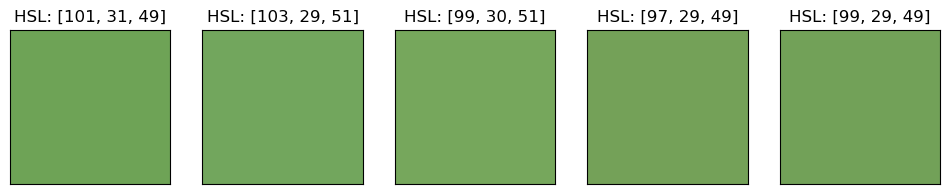

In [127]:
fig, ax = plt.subplots(1, len(predicted_top_5_colours), figsize=(12,2))
for i, hsl in enumerate(predicted_top_5_colours):
    rgb = convert_colour(hsl[0]/360, hsl[1]/100, hsl[2]/100)
    ax[i].add_patch(plt.Rectangle((0, 0), 1, 1, color=[comp/255 for comp in rgb]))
    ax[i].set_title(f'HSL: {hsl}')
    ax[i].set_xticks([])
    ax[i].set_yticks([])
plt.show()

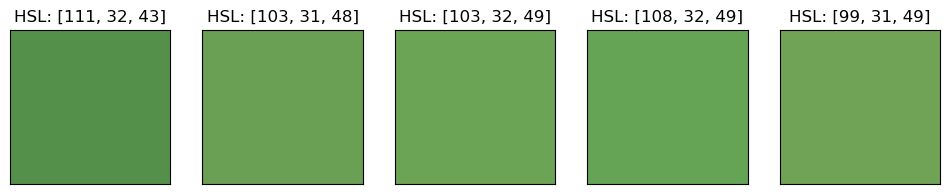

In [250]:
# Trying another category
predicted_top_5_colours = []
for j in range(5):
    column_name = f"hsl_{j+1}"
    colour_pred = []
    for i in range(3):
        y = main_df[column_name].apply(lambda x: x[i])
        X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=450)
        hsl_model_dt = DecisionTreeRegressor()
        hsl_model_dt.fit(X_train, y_train)
        new_X = pd.Series(["Romance"])
        new_X_encoded = onehotencoder.transform(pd.DataFrame(new_X))
        new_prediction = hsl_model_dt.predict(new_X_encoded)
        colour_pred.append(int(new_prediction[0].round()))
    predicted_top_5_colours.append(colour_pred)
fig, ax = plt.subplots(1, len(predicted_top_5_colours), figsize=(12,2))
for i, hsl in enumerate(predicted_top_5_colours):
    rgb = convert_colour(hsl[0]/360, hsl[1]/100, hsl[2]/100)
    ax[i].add_patch(plt.Rectangle((0, 0), 1, 1, color=[comp/255 for comp in rgb]))
    ax[i].set_title(f'HSL: {hsl}')
    ax[i].set_xticks([])
    ax[i].set_yticks([])
plt.show()

In [210]:
categories

["Children's Books",
 'Sports & Outdoors',
 'Health, Fitness & Dieting',
 'Medical Books',
 'Travel',
 'Business & Money',
 'Cookbooks, Food & Wine',
 'Politics & Social Sciences',
 'Crafts, Hobbies & Home',
 'Religion & Spirituality',
 'Literature & Fiction',
 'Science & Math',
 'Humor & Entertainment',
 'Computers & Technology',
 'Biographies & Memoirs',
 'Arts & Photography',
 'Christian Books & Bibles',
 'Romance',
 'Comics & Graphic Novels',
 'Reference',
 'History',
 'Teen & Young Adult',
 'Parenting & Relationships',
 'Law',
 'Self-Help',
 'Science Fiction & Fantasy',
 'Test Preparation',
 'Engineering & Transportation',
 'Calendars',
 'Mystery, Thriller & Suspense']

Children's Books


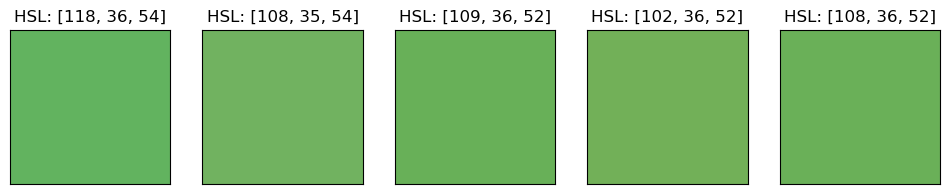

Sports & Outdoors


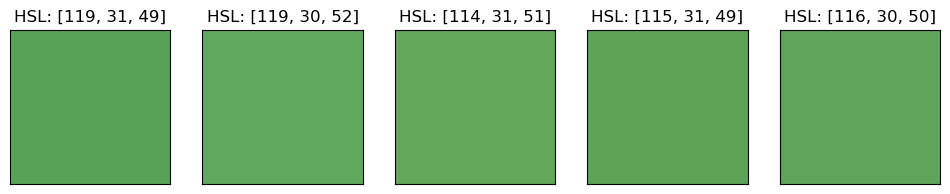

Health, Fitness & Dieting


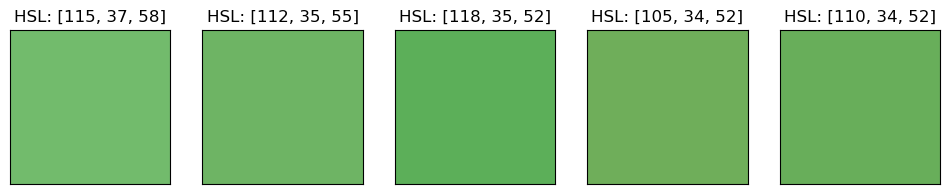

Medical Books


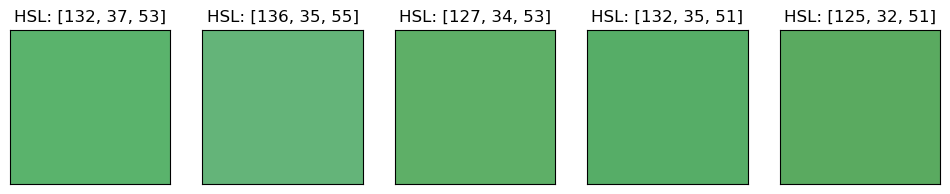

Travel


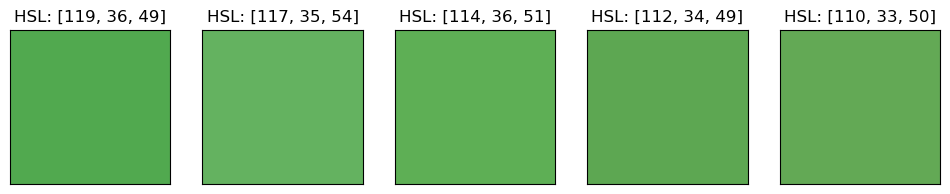

Business & Money


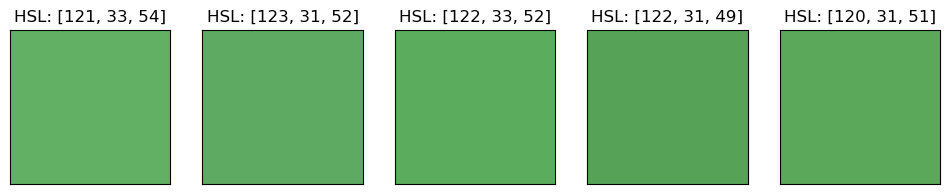

Cookbooks, Food & Wine


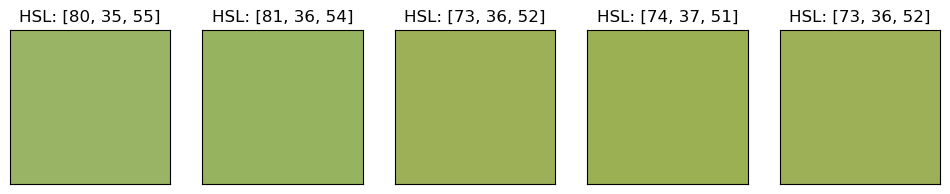

Politics & Social Sciences


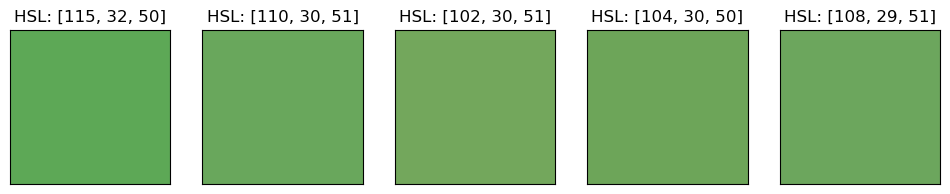

Crafts, Hobbies & Home


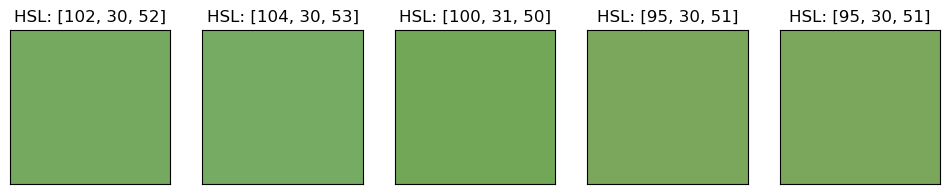

Religion & Spirituality


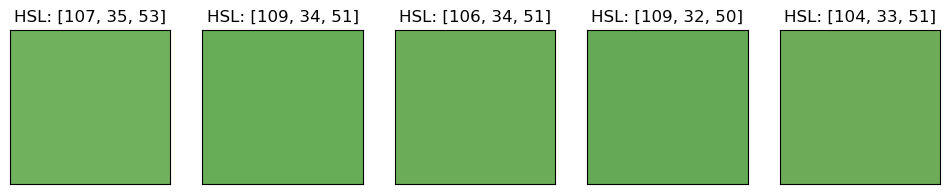

Literature & Fiction


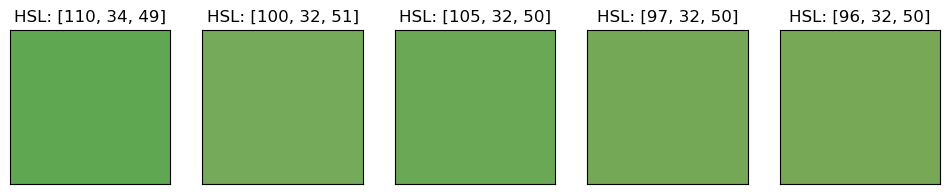

Science & Math


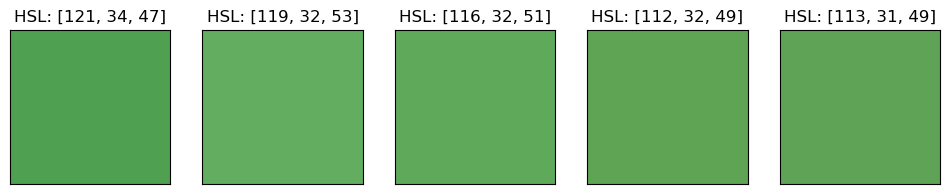

Humor & Entertainment


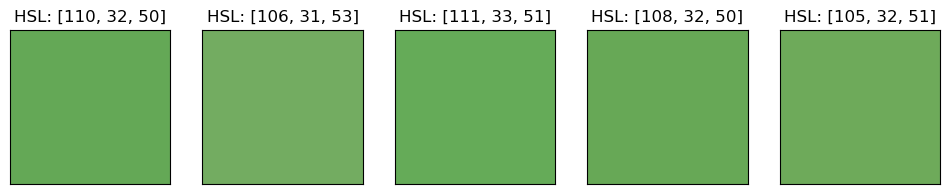

Computers & Technology


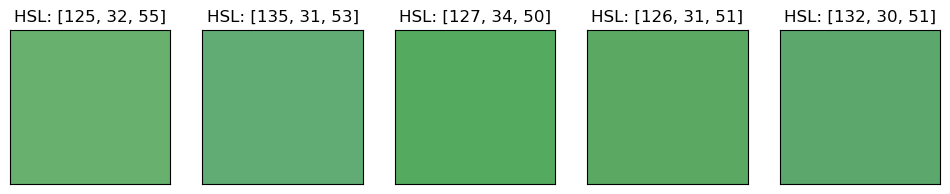

Biographies & Memoirs


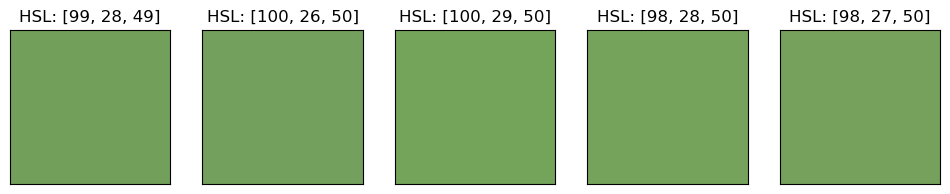

Arts & Photography


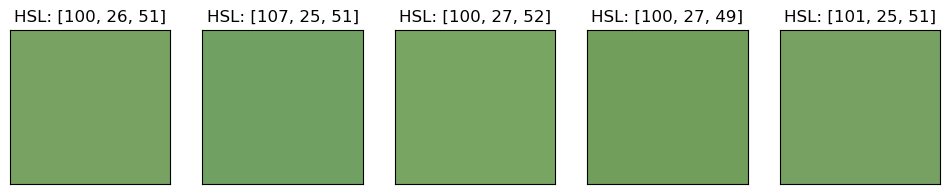

Christian Books & Bibles


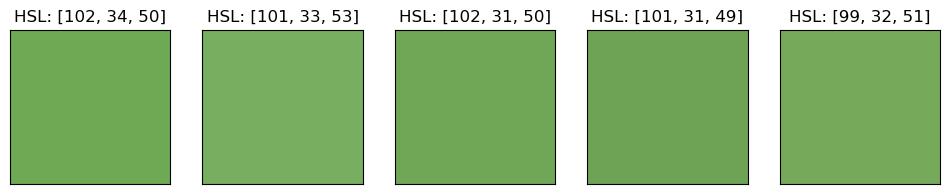

Romance


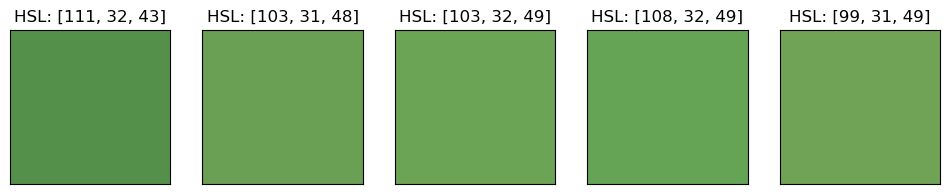

Comics & Graphic Novels


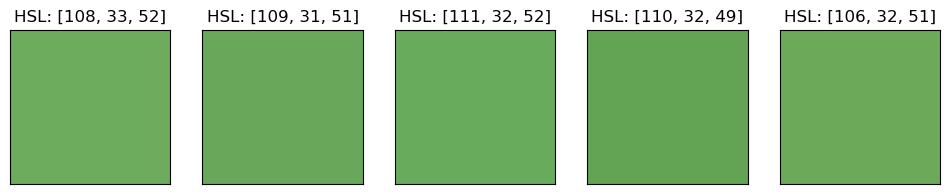

Reference


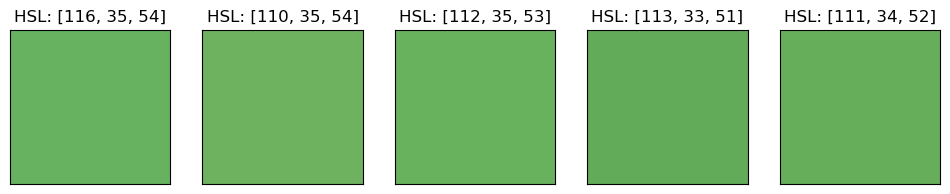

History


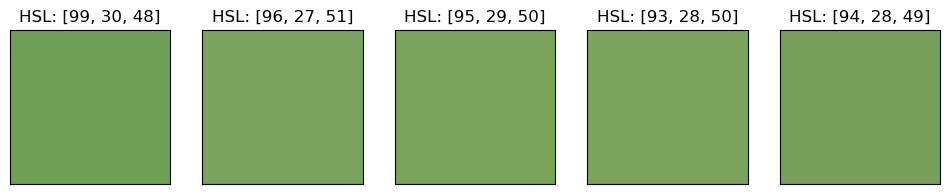

Teen & Young Adult


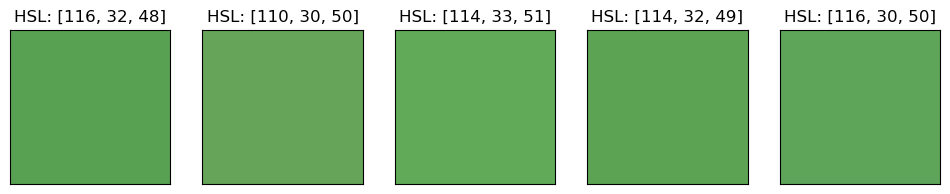

Parenting & Relationships


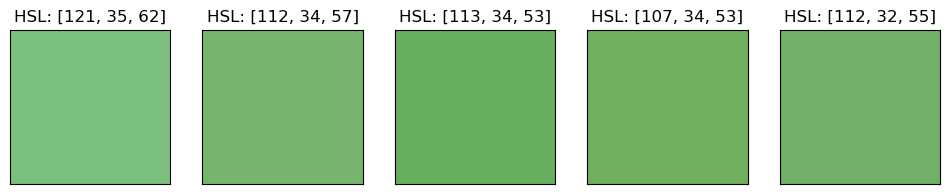

Law


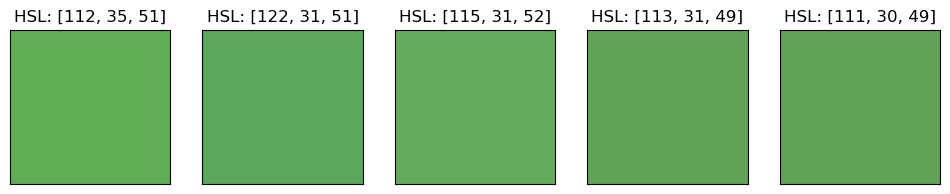

Self-Help


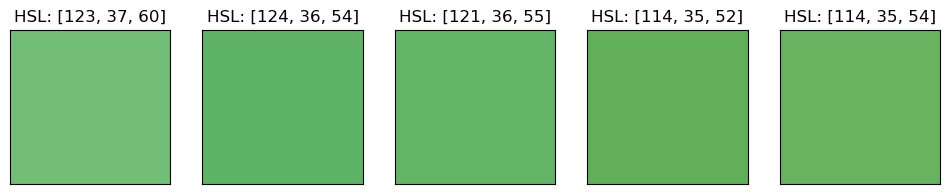

Science Fiction & Fantasy


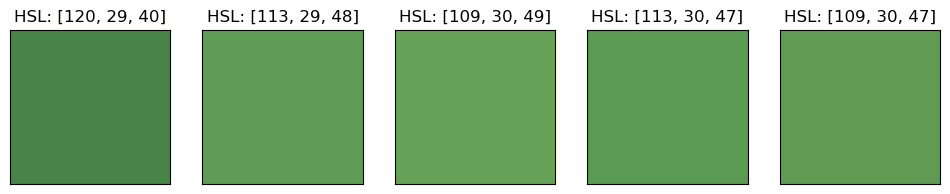

Test Preparation


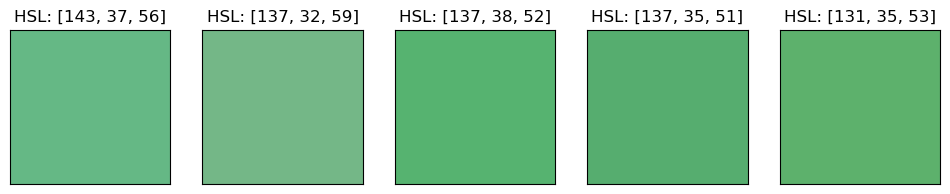

Engineering & Transportation


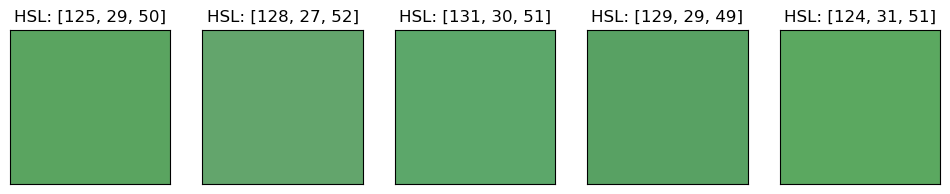

Calendars


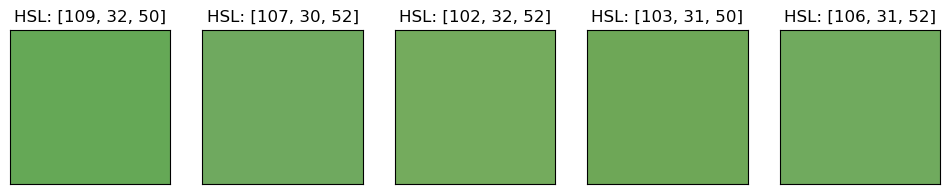

Mystery, Thriller & Suspense


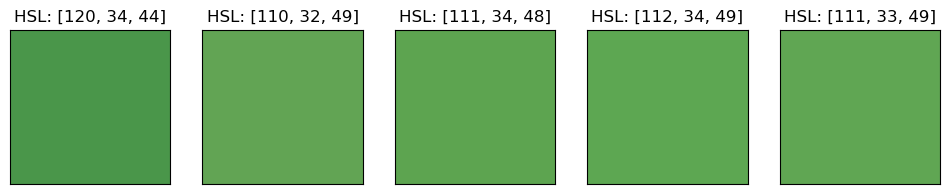

In [251]:
for category in categories:
    print(category)
    predicted_top_5_colours = []
    for j in range(5):
        column_name = f"hsl_{j+1}"
        colour_pred = []
        for i in range(3):
            y = main_df[column_name].apply(lambda x: x[i])
            X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=450)
            hsl_model_dt = DecisionTreeRegressor()
            hsl_model_dt.fit(X_train, y_train)
            new_X = pd.Series([category])
            new_X_encoded = onehotencoder.transform(pd.DataFrame(new_X))
            new_prediction = hsl_model_dt.predict(new_X_encoded)
            colour_pred.append(int(new_prediction[0].round()))
        predicted_top_5_colours.append(colour_pred)
    fig, ax = plt.subplots(1, len(predicted_top_5_colours), figsize=(12,2))
    for i, hsl in enumerate(predicted_top_5_colours):
        rgb = convert_colour(hsl[0]/360, hsl[1]/100, hsl[2]/100)
        ax[i].add_patch(plt.Rectangle((0, 0), 1, 1, color=[comp/255 for comp in rgb]))
        ax[i].set_title(f'HSL: {hsl}')
        ax[i].set_xticks([])
        ax[i].set_yticks([])
    plt.show()

This is also showing very similar colours for different categories. Since regression models are not working properly we will try some categorisation models. But before that we will convert these HSL values into categorical values. Each entry is assigned a dominant colour based on the hue and lightness. The saturation is omitted for this classification. The following are the criterion under which the colours were categorised:

###### HUE:

Red 0-60 and 300-360

Green 60 - 180 

Blue 180 - 300

###### LIGHTNESS:

Black 0-20 

White 80-100 

Ref : https://www.w3schools.com/html/html_colors_hsl.asp

In [129]:
# Converting into labels
def label_value(values):
    hue, _, lightness = values

    # Lightness Check
    if lightness >= 0 and lightness <= 20:
        return "Black"
    elif lightness >= 80 and lightness <= 100:
        return "White"

    # Hue Check
    if (hue >= 0 and hue <= 60) or (hue >= 300 and hue <= 360):
        return "Red"
    elif hue >= 60 and hue < 180:
        return "Green"
    elif hue >= 180 and hue < 300:
        return "Blue"

In [132]:
# Apply the label_value function to the 'colors' column
main_df['Colour1_labels'] = main_df['hsl_1'].apply(label_value)
main_df['Colour2_labels'] = main_df['hsl_2'].apply(label_value)
main_df['Colour3_labels'] = main_df['hsl_3'].apply(label_value)
main_df['Colour4_labels'] = main_df['hsl_4'].apply(label_value)
main_df['Colour5_labels'] = main_df['hsl_5'].apply(label_value)

In [133]:
main_df.head()

,Index,Filename,URL,Title,Author,Category_ID,Category,Colours,Text_Area,Objects,...,hsl_1,hsl_2,hsl_3,hsl_4,hsl_5,Colour1_labels,Colour2_labels,Colour3_labels,Colour4_labels,Colour5_labels
0,1404803335,1404803335.jpg,http://ecx.images-amazon.com/images/I/51UJnL3T...,"Magnets: Pulling Together, Pushing Apart (Amaz...",Natalie M. Rosinsky,4,Children's Books,"[[107, 182, 220], [186, 37, 28], [235, 233, 41...",38.05,[Dragonfly],...,"(200, 61.7, 64.1)","(3, 73.8, 42.0)","(59, 82.9, 54.1)","(198, 6.3, 50.2)","(5, 13.2, 14.9)",Blue,Red,Red,Blue,Black
1,1446276082,1446276082.jpg,http://ecx.images-amazon.com/images/I/51MGUKhk...,Energy Security (SAGE Library International Se...,NaN,10,Engineering & Transportation,"[[5, 3, 4], [142, 3, 3], [172, 131, 105], [69,...",5.13,NaN,...,"(330, 25.0, 1.6)","(0, 95.9, 28.4)","(23, 28.8, 54.3)","(21, 31.4, 20.6)","(6, 61.0, 39.2)",Black,Red,Red,Red,Red
2,1491522666,1491522666.jpg,http://ecx.images-amazon.com/images/I/51qKvjsi...,An Amish Gathering: Life Lancaster County,Beth Wiseman,9,Christian Books & Bibles,"[[43, 35, 14], [244, 250, 186], [135, 138, 42]...",8.85,NaN,...,"(43, 50.9, 11.2)","(65, 86.5, 85.5)","(61, 53.3, 35.3)","(30, 91.2, 55.7)","(69, 69.9, 73.9)",Black,White,Green,Red,Green
3,970096410,0970096410.jpg,http://ecx.images-amazon.com/images/I/51qoUENb...,City Rocks Idaho: A Climber's Guide (Regional ...,Dave Bingham,26,Sports & Outdoors,"[[88, 131, 209], [43, 49, 49], [152, 183, 236]...",6.81,[Animal],...,"(218, 56.8, 58.2)","(180, 6.5, 18.0)","(217, 68.9, 76.1)","(120, 2.3, 42.9)","(65, 15.6, 58.6)",Blue,Black,Blue,Green,Green
4,8436808053,8436808053.jpg,http://ecx.images-amazon.com/images/I/41aDW5pz...,"Como vencer el insomnio. Tecnicas, reglas cons...",Choliz Montanes,11,"Health, Fitness & Dieting","[[248, 249, 249], [126, 77, 53], [167, 126, 93...",14.56,"[Person, Book]",...,"(180, 7.7, 97.5)","(19, 40.8, 35.1)","(26, 29.6, 51.0)","(31, 15.1, 72.7)","(14, 36.5, 20.4)",White,Red,Red,Red,Red


In [147]:
# Encoding the Category values
onehotencoder = OneHotEncoder()
X = onehotencoder.fit_transform(pd.DataFrame(main_df['Category']))

In [148]:
y = main_df['Colour1_labels']

In [149]:
# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=450)

### Decision Tree Classifier

In [150]:
label_model_dt = DecisionTreeClassifier()
label_model_dt.fit(X_train, y_train)
pred = label_model_dt.predict(X_test)
print("Accuracy:", accuracy_score(y_test, pred))
print("Classification Report:\n", classification_report(y_test, pred))
print("Confusion Matrix:\n", confusion_matrix(y_test, pred))

Accuracy: 0.36210526315789476
Classification Report:
               precision    recall  f1-score   support

       Black       0.00      0.00      0.00      1940
        Blue       0.00      0.00      0.00      1979
       Green       0.00      0.00      0.00       910
         Red       0.36      0.97      0.53      4129
       White       0.35      0.05      0.09      2442

    accuracy                           0.36     11400
   macro avg       0.14      0.20      0.12     11400
weighted avg       0.21      0.36      0.21     11400

Confusion Matrix:
 [[   0    0    0 1914   26]
 [   0    0    0 1923   56]
 [   0    0    0  887   23]
 [   0    0    0 4004  125]
 [   0    0    0 2318  124]]


C:\Users\reeth\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\reeth\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\reeth\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


### Random Forest Classifier

In [151]:
label_model_rf = RandomForestClassifier()
label_model_rf.fit(X_train, y_train)
pred = label_model_rf.predict(X_test)
print("Accuracy:", accuracy_score(y_test, pred))
print("Classification Report:\n", classification_report(y_test, pred))
print("Confusion Matrix:\n", confusion_matrix(y_test, pred))

Accuracy: 0.36210526315789476


C:\Users\reeth\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\reeth\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\reeth\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Classification Report:
               precision    recall  f1-score   support

       Black       0.00      0.00      0.00      1940
        Blue       0.00      0.00      0.00      1979
       Green       0.00      0.00      0.00       910
         Red       0.36      0.97      0.53      4129
       White       0.35      0.05      0.09      2442

    accuracy                           0.36     11400
   macro avg       0.14      0.20      0.12     11400
weighted avg       0.21      0.36      0.21     11400

Confusion Matrix:
 [[   0    0    0 1914   26]
 [   0    0    0 1923   56]
 [   0    0    0  887   23]
 [   0    0    0 4004  125]
 [   0    0    0 2318  124]]


### Logistic Regression

In [152]:
label_model_lr = LogisticRegression(multi_class='multinomial', solver='lbfgs', random_state=450)
label_model_lr.fit(X_train, y_train)
pred = label_model_lr.predict(X_test)
print("Accuracy:", accuracy_score(y_test, pred))
print("Classification Report:\n", classification_report(y_test, pred))
print("Confusion Matrix:\n", confusion_matrix(y_test, pred))

Accuracy: 0.36210526315789476
Classification Report:
               precision    recall  f1-score   support

       Black       0.00      0.00      0.00      1940
        Blue       0.00      0.00      0.00      1979
       Green       0.00      0.00      0.00       910
         Red       0.36      0.97      0.53      4129
       White       0.35      0.05      0.09      2442

    accuracy                           0.36     11400
   macro avg       0.14      0.20      0.12     11400
weighted avg       0.21      0.36      0.21     11400

Confusion Matrix:
 [[   0    0    0 1914   26]
 [   0    0    0 1923   56]
 [   0    0    0  887   23]
 [   0    0    0 4004  125]
 [   0    0    0 2318  124]]


C:\Users\reeth\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\reeth\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\reeth\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


### Support Vector Machines

In [153]:
label_model_svm = SVC(decision_function_shape='ovr', random_state=450)
label_model_svm.fit(X_train, y_train)
pred = label_model_svm.predict(X_test)
print("Accuracy:", accuracy_score(y_test, pred))
print("Classification Report:\n", classification_report(y_test, pred))
print("Confusion Matrix:\n", confusion_matrix(y_test, pred))

Accuracy: 0.36210526315789476


C:\Users\reeth\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\reeth\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\reeth\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Classification Report:
               precision    recall  f1-score   support

       Black       0.00      0.00      0.00      1940
        Blue       0.00      0.00      0.00      1979
       Green       0.00      0.00      0.00       910
         Red       0.36      0.97      0.53      4129
       White       0.35      0.05      0.09      2442

    accuracy                           0.36     11400
   macro avg       0.14      0.20      0.12     11400
weighted avg       0.21      0.36      0.21     11400

Confusion Matrix:
 [[   0    0    0 1914   26]
 [   0    0    0 1923   56]
 [   0    0    0  887   23]
 [   0    0    0 4004  125]
 [   0    0    0 2318  124]]


Since all the models have the exact same accuracy, we'll use the logistic rergession model for prediction.

In [155]:
new_X = pd.Series(["Children's Books"])
new_X_encoded = onehotencoder.transform(pd.DataFrame(new_X))
label1_pred = label_model_lr.predict(new_X_encoded)
print(f'Predicted label: {label1_pred[0]}')

Predicted label: Red


C:\Users\reeth\anaconda3\lib\site-packages\sklearn\base.py:420: UserWarning: X does not have valid feature names, but OneHotEncoder was fitted with feature names
  warnings.warn(


In [156]:
# Predicting colours from all five columns
predicted_labels = []
for j in range(5):
    column_name = f"Colour{j+1}_labels"
    y = main_df[column_name]
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=450)
    label_model_lr = LogisticRegression(multi_class='multinomial', solver='lbfgs', random_state=450)
    label_model_lr.fit(X_train, y_train)
    new_X = pd.Series(["Children's Books"])
    new_X_encoded = onehotencoder.transform(pd.DataFrame(new_X))
    new_prediction = label_model_lr.predict(new_X_encoded)
    predicted_labels.append(new_prediction[0])
predicted_labels

C:\Users\reeth\anaconda3\lib\site-packages\sklearn\base.py:420: UserWarning: X does not have valid feature names, but OneHotEncoder was fitted with feature names
  warnings.warn(
C:\Users\reeth\anaconda3\lib\site-packages\sklearn\base.py:420: UserWarning: X does not have valid feature names, but OneHotEncoder was fitted with feature names
  warnings.warn(
C:\Users\reeth\anaconda3\lib\site-packages\sklearn\base.py:420: UserWarning: X does not have valid feature names, but OneHotEncoder was fitted with feature names
  warnings.warn(
C:\Users\reeth\anaconda3\lib\site-packages\sklearn\base.py:420: UserWarning: X does not have valid feature names, but OneHotEncoder was fitted with feature names
  warnings.warn(
C:\Users\reeth\anaconda3\lib\site-packages\sklearn\base.py:420: UserWarning: X does not have valid feature names, but OneHotEncoder was fitted with feature names
  warnings.warn(


['Red', 'Red', 'Red', 'Red', 'Red']

In [157]:
# Trying another category
predicted_labels = []
for j in range(5):
    column_name = f"Colour{j+1}_labels"
    y = main_df[column_name]
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=450)
    label_model_lr = LogisticRegression(multi_class='multinomial', solver='lbfgs', random_state=450)
    label_model_lr.fit(X_train, y_train)
    new_X = pd.Series(["Health, Fitness & Dieting"])
    new_X_encoded = onehotencoder.transform(pd.DataFrame(new_X))
    new_prediction = label_model_lr.predict(new_X_encoded)
    predicted_labels.append(new_prediction[0])
predicted_labels

C:\Users\reeth\anaconda3\lib\site-packages\sklearn\base.py:420: UserWarning: X does not have valid feature names, but OneHotEncoder was fitted with feature names
  warnings.warn(
C:\Users\reeth\anaconda3\lib\site-packages\sklearn\base.py:420: UserWarning: X does not have valid feature names, but OneHotEncoder was fitted with feature names
  warnings.warn(
C:\Users\reeth\anaconda3\lib\site-packages\sklearn\base.py:420: UserWarning: X does not have valid feature names, but OneHotEncoder was fitted with feature names
  warnings.warn(
C:\Users\reeth\anaconda3\lib\site-packages\sklearn\base.py:420: UserWarning: X does not have valid feature names, but OneHotEncoder was fitted with feature names
  warnings.warn(
C:\Users\reeth\anaconda3\lib\site-packages\sklearn\base.py:420: UserWarning: X does not have valid feature names, but OneHotEncoder was fitted with feature names
  warnings.warn(


['Red', 'Red', 'Red', 'Red', 'Red']

Both the models output the same label(red). We'll compare the output with the actual distribution of the labels in these two categories.

<Figure size 1000x600 with 0 Axes>

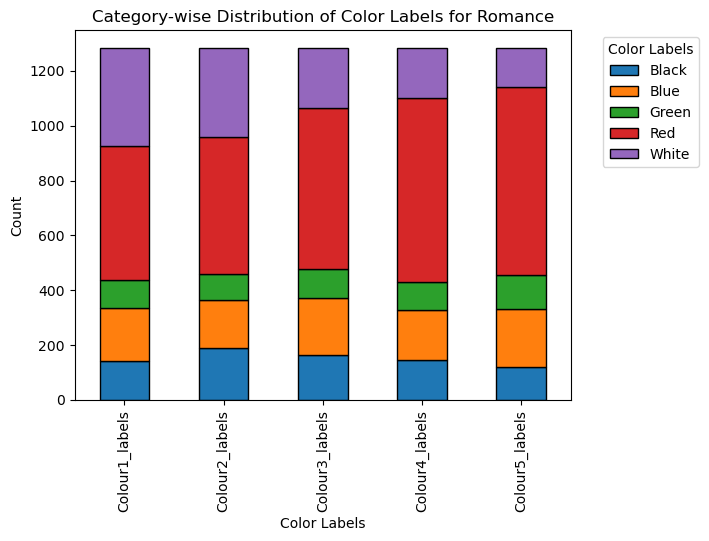

In [241]:
category_ = 'Health, Fitness & Dieting'
category_subset = main_df[main_df['Category'] == category_]

# Count the occurrences of each color label in the subset
color_counts = category_subset[['Colour1_labels', 'Colour2_labels', 'Colour3_labels', 'Colour4_labels', 'Colour5_labels']].apply(pd.value_counts).fillna(0)

# Plot the distribution of color labels for the specified category
plt.figure(figsize=(10, 6))
color_counts.T.plot(kind='bar', stacked=True, edgecolor='black')
plt.title(f'Category-wise Distribution of Color Labels for {category_of_interest}')
plt.xlabel('Color Labels')
plt.ylabel('Count')
plt.legend(title='Color Labels', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.show()

<Figure size 1000x600 with 0 Axes>

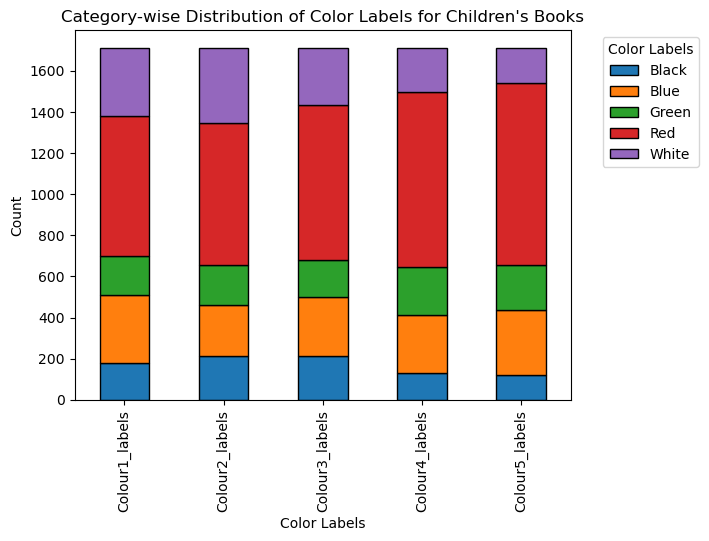

In [253]:
category_ = "Children's Books"
category_subset = main_df[main_df['Category'] == category_]

# Count the occurrences of each color label in the subset
color_counts = category_subset[['Colour1_labels', 'Colour2_labels', 'Colour3_labels', 'Colour4_labels', 'Colour5_labels']].apply(pd.value_counts).fillna(0)

# Plot the distribution of color labels for the specified category
plt.figure(figsize=(10, 6))
color_counts.T.plot(kind='bar', stacked=True, edgecolor='black')
plt.title(f'Category-wise Distribution of Color Labels for {category_}')
plt.xlabel('Color Labels')
plt.ylabel('Count')
plt.legend(title='Color Labels', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.show()

We can see that the data is heavily biased for the label 'Red' which could be causing the models to give the same colour regardless the category.

In [212]:
categories

["Children's Books",
 'Sports & Outdoors',
 'Health, Fitness & Dieting',
 'Medical Books',
 'Travel',
 'Business & Money',
 'Cookbooks, Food & Wine',
 'Politics & Social Sciences',
 'Crafts, Hobbies & Home',
 'Religion & Spirituality',
 'Literature & Fiction',
 'Science & Math',
 'Humor & Entertainment',
 'Computers & Technology',
 'Biographies & Memoirs',
 'Arts & Photography',
 'Christian Books & Bibles',
 'Romance',
 'Comics & Graphic Novels',
 'Reference',
 'History',
 'Teen & Young Adult',
 'Parenting & Relationships',
 'Law',
 'Self-Help',
 'Science Fiction & Fantasy',
 'Test Preparation',
 'Engineering & Transportation',
 'Calendars',
 'Mystery, Thriller & Suspense']

In [214]:
for category in categories:
    predicted_labels = []
    for j in range(5):
        column_name = f"Colour{j+1}_labels"
        y = main_df[column_name]
        X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=450)
        label_model_lr = LogisticRegression(multi_class='multinomial', solver='lbfgs', random_state=450)
        label_model_lr.fit(X_train, y_train)
        new_X = pd.Series([category])
        new_X_encoded = onehotencoder.transform(pd.DataFrame(new_X))
        new_prediction = label_model_lr.predict(new_X_encoded)
        predicted_labels.append(new_prediction[0])
    print(f"{category}: {predicted_labels}")

C:\Users\reeth\anaconda3\lib\site-packages\sklearn\base.py:420: UserWarning: X does not have valid feature names, but OneHotEncoder was fitted with feature names
  warnings.warn(
C:\Users\reeth\anaconda3\lib\site-packages\sklearn\base.py:420: UserWarning: X does not have valid feature names, but OneHotEncoder was fitted with feature names
  warnings.warn(
C:\Users\reeth\anaconda3\lib\site-packages\sklearn\base.py:420: UserWarning: X does not have valid feature names, but OneHotEncoder was fitted with feature names
  warnings.warn(
C:\Users\reeth\anaconda3\lib\site-packages\sklearn\base.py:420: UserWarning: X does not have valid feature names, but OneHotEncoder was fitted with feature names
  warnings.warn(
C:\Users\reeth\anaconda3\lib\site-packages\sklearn\base.py:420: UserWarning: X does not have valid feature names, but OneHotEncoder was fitted with feature names
  warnings.warn(


Children's Books: ['Red', 'Red', 'Red', 'Red', 'Red']


C:\Users\reeth\anaconda3\lib\site-packages\sklearn\base.py:420: UserWarning: X does not have valid feature names, but OneHotEncoder was fitted with feature names
  warnings.warn(
C:\Users\reeth\anaconda3\lib\site-packages\sklearn\base.py:420: UserWarning: X does not have valid feature names, but OneHotEncoder was fitted with feature names
  warnings.warn(
C:\Users\reeth\anaconda3\lib\site-packages\sklearn\base.py:420: UserWarning: X does not have valid feature names, but OneHotEncoder was fitted with feature names
  warnings.warn(
C:\Users\reeth\anaconda3\lib\site-packages\sklearn\base.py:420: UserWarning: X does not have valid feature names, but OneHotEncoder was fitted with feature names
  warnings.warn(
C:\Users\reeth\anaconda3\lib\site-packages\sklearn\base.py:420: UserWarning: X does not have valid feature names, but OneHotEncoder was fitted with feature names
  warnings.warn(


Sports & Outdoors: ['Red', 'Red', 'Red', 'Red', 'Red']


C:\Users\reeth\anaconda3\lib\site-packages\sklearn\base.py:420: UserWarning: X does not have valid feature names, but OneHotEncoder was fitted with feature names
  warnings.warn(
C:\Users\reeth\anaconda3\lib\site-packages\sklearn\base.py:420: UserWarning: X does not have valid feature names, but OneHotEncoder was fitted with feature names
  warnings.warn(
C:\Users\reeth\anaconda3\lib\site-packages\sklearn\base.py:420: UserWarning: X does not have valid feature names, but OneHotEncoder was fitted with feature names
  warnings.warn(
C:\Users\reeth\anaconda3\lib\site-packages\sklearn\base.py:420: UserWarning: X does not have valid feature names, but OneHotEncoder was fitted with feature names
  warnings.warn(
C:\Users\reeth\anaconda3\lib\site-packages\sklearn\base.py:420: UserWarning: X does not have valid feature names, but OneHotEncoder was fitted with feature names
  warnings.warn(


Health, Fitness & Dieting: ['Red', 'Red', 'Red', 'Red', 'Red']


C:\Users\reeth\anaconda3\lib\site-packages\sklearn\base.py:420: UserWarning: X does not have valid feature names, but OneHotEncoder was fitted with feature names
  warnings.warn(
C:\Users\reeth\anaconda3\lib\site-packages\sklearn\base.py:420: UserWarning: X does not have valid feature names, but OneHotEncoder was fitted with feature names
  warnings.warn(
C:\Users\reeth\anaconda3\lib\site-packages\sklearn\base.py:420: UserWarning: X does not have valid feature names, but OneHotEncoder was fitted with feature names
  warnings.warn(
C:\Users\reeth\anaconda3\lib\site-packages\sklearn\base.py:420: UserWarning: X does not have valid feature names, but OneHotEncoder was fitted with feature names
  warnings.warn(
C:\Users\reeth\anaconda3\lib\site-packages\sklearn\base.py:420: UserWarning: X does not have valid feature names, but OneHotEncoder was fitted with feature names
  warnings.warn(


Medical Books: ['Red', 'Red', 'Red', 'Red', 'Red']


C:\Users\reeth\anaconda3\lib\site-packages\sklearn\base.py:420: UserWarning: X does not have valid feature names, but OneHotEncoder was fitted with feature names
  warnings.warn(
C:\Users\reeth\anaconda3\lib\site-packages\sklearn\base.py:420: UserWarning: X does not have valid feature names, but OneHotEncoder was fitted with feature names
  warnings.warn(
C:\Users\reeth\anaconda3\lib\site-packages\sklearn\base.py:420: UserWarning: X does not have valid feature names, but OneHotEncoder was fitted with feature names
  warnings.warn(
C:\Users\reeth\anaconda3\lib\site-packages\sklearn\base.py:420: UserWarning: X does not have valid feature names, but OneHotEncoder was fitted with feature names
  warnings.warn(
C:\Users\reeth\anaconda3\lib\site-packages\sklearn\base.py:420: UserWarning: X does not have valid feature names, but OneHotEncoder was fitted with feature names
  warnings.warn(


Travel: ['Red', 'Red', 'Red', 'Red', 'Red']


C:\Users\reeth\anaconda3\lib\site-packages\sklearn\base.py:420: UserWarning: X does not have valid feature names, but OneHotEncoder was fitted with feature names
  warnings.warn(
C:\Users\reeth\anaconda3\lib\site-packages\sklearn\base.py:420: UserWarning: X does not have valid feature names, but OneHotEncoder was fitted with feature names
  warnings.warn(
C:\Users\reeth\anaconda3\lib\site-packages\sklearn\base.py:420: UserWarning: X does not have valid feature names, but OneHotEncoder was fitted with feature names
  warnings.warn(
C:\Users\reeth\anaconda3\lib\site-packages\sklearn\base.py:420: UserWarning: X does not have valid feature names, but OneHotEncoder was fitted with feature names
  warnings.warn(
C:\Users\reeth\anaconda3\lib\site-packages\sklearn\base.py:420: UserWarning: X does not have valid feature names, but OneHotEncoder was fitted with feature names
  warnings.warn(


Business & Money: ['Red', 'Red', 'Red', 'Red', 'Red']


C:\Users\reeth\anaconda3\lib\site-packages\sklearn\base.py:420: UserWarning: X does not have valid feature names, but OneHotEncoder was fitted with feature names
  warnings.warn(
C:\Users\reeth\anaconda3\lib\site-packages\sklearn\base.py:420: UserWarning: X does not have valid feature names, but OneHotEncoder was fitted with feature names
  warnings.warn(
C:\Users\reeth\anaconda3\lib\site-packages\sklearn\base.py:420: UserWarning: X does not have valid feature names, but OneHotEncoder was fitted with feature names
  warnings.warn(
C:\Users\reeth\anaconda3\lib\site-packages\sklearn\base.py:420: UserWarning: X does not have valid feature names, but OneHotEncoder was fitted with feature names
  warnings.warn(
C:\Users\reeth\anaconda3\lib\site-packages\sklearn\base.py:420: UserWarning: X does not have valid feature names, but OneHotEncoder was fitted with feature names
  warnings.warn(


Cookbooks, Food & Wine: ['Red', 'Red', 'Red', 'Red', 'Red']


C:\Users\reeth\anaconda3\lib\site-packages\sklearn\base.py:420: UserWarning: X does not have valid feature names, but OneHotEncoder was fitted with feature names
  warnings.warn(
C:\Users\reeth\anaconda3\lib\site-packages\sklearn\base.py:420: UserWarning: X does not have valid feature names, but OneHotEncoder was fitted with feature names
  warnings.warn(
C:\Users\reeth\anaconda3\lib\site-packages\sklearn\base.py:420: UserWarning: X does not have valid feature names, but OneHotEncoder was fitted with feature names
  warnings.warn(
C:\Users\reeth\anaconda3\lib\site-packages\sklearn\base.py:420: UserWarning: X does not have valid feature names, but OneHotEncoder was fitted with feature names
  warnings.warn(
C:\Users\reeth\anaconda3\lib\site-packages\sklearn\base.py:420: UserWarning: X does not have valid feature names, but OneHotEncoder was fitted with feature names
  warnings.warn(


Politics & Social Sciences: ['Red', 'Red', 'Red', 'Red', 'Red']


C:\Users\reeth\anaconda3\lib\site-packages\sklearn\base.py:420: UserWarning: X does not have valid feature names, but OneHotEncoder was fitted with feature names
  warnings.warn(
C:\Users\reeth\anaconda3\lib\site-packages\sklearn\base.py:420: UserWarning: X does not have valid feature names, but OneHotEncoder was fitted with feature names
  warnings.warn(
C:\Users\reeth\anaconda3\lib\site-packages\sklearn\base.py:420: UserWarning: X does not have valid feature names, but OneHotEncoder was fitted with feature names
  warnings.warn(
C:\Users\reeth\anaconda3\lib\site-packages\sklearn\base.py:420: UserWarning: X does not have valid feature names, but OneHotEncoder was fitted with feature names
  warnings.warn(
C:\Users\reeth\anaconda3\lib\site-packages\sklearn\base.py:420: UserWarning: X does not have valid feature names, but OneHotEncoder was fitted with feature names
  warnings.warn(


Crafts, Hobbies & Home: ['Red', 'Red', 'Red', 'Red', 'Red']


C:\Users\reeth\anaconda3\lib\site-packages\sklearn\base.py:420: UserWarning: X does not have valid feature names, but OneHotEncoder was fitted with feature names
  warnings.warn(
C:\Users\reeth\anaconda3\lib\site-packages\sklearn\base.py:420: UserWarning: X does not have valid feature names, but OneHotEncoder was fitted with feature names
  warnings.warn(
C:\Users\reeth\anaconda3\lib\site-packages\sklearn\base.py:420: UserWarning: X does not have valid feature names, but OneHotEncoder was fitted with feature names
  warnings.warn(
C:\Users\reeth\anaconda3\lib\site-packages\sklearn\base.py:420: UserWarning: X does not have valid feature names, but OneHotEncoder was fitted with feature names
  warnings.warn(
C:\Users\reeth\anaconda3\lib\site-packages\sklearn\base.py:420: UserWarning: X does not have valid feature names, but OneHotEncoder was fitted with feature names
  warnings.warn(


Religion & Spirituality: ['Red', 'Red', 'Red', 'Red', 'Red']


C:\Users\reeth\anaconda3\lib\site-packages\sklearn\base.py:420: UserWarning: X does not have valid feature names, but OneHotEncoder was fitted with feature names
  warnings.warn(
C:\Users\reeth\anaconda3\lib\site-packages\sklearn\base.py:420: UserWarning: X does not have valid feature names, but OneHotEncoder was fitted with feature names
  warnings.warn(
C:\Users\reeth\anaconda3\lib\site-packages\sklearn\base.py:420: UserWarning: X does not have valid feature names, but OneHotEncoder was fitted with feature names
  warnings.warn(
C:\Users\reeth\anaconda3\lib\site-packages\sklearn\base.py:420: UserWarning: X does not have valid feature names, but OneHotEncoder was fitted with feature names
  warnings.warn(
C:\Users\reeth\anaconda3\lib\site-packages\sklearn\base.py:420: UserWarning: X does not have valid feature names, but OneHotEncoder was fitted with feature names
  warnings.warn(


Literature & Fiction: ['Red', 'Red', 'Red', 'Red', 'Red']


C:\Users\reeth\anaconda3\lib\site-packages\sklearn\base.py:420: UserWarning: X does not have valid feature names, but OneHotEncoder was fitted with feature names
  warnings.warn(
C:\Users\reeth\anaconda3\lib\site-packages\sklearn\base.py:420: UserWarning: X does not have valid feature names, but OneHotEncoder was fitted with feature names
  warnings.warn(
C:\Users\reeth\anaconda3\lib\site-packages\sklearn\base.py:420: UserWarning: X does not have valid feature names, but OneHotEncoder was fitted with feature names
  warnings.warn(
C:\Users\reeth\anaconda3\lib\site-packages\sklearn\base.py:420: UserWarning: X does not have valid feature names, but OneHotEncoder was fitted with feature names
  warnings.warn(
C:\Users\reeth\anaconda3\lib\site-packages\sklearn\base.py:420: UserWarning: X does not have valid feature names, but OneHotEncoder was fitted with feature names
  warnings.warn(


Science & Math: ['Red', 'Red', 'Red', 'Red', 'Red']


C:\Users\reeth\anaconda3\lib\site-packages\sklearn\base.py:420: UserWarning: X does not have valid feature names, but OneHotEncoder was fitted with feature names
  warnings.warn(
C:\Users\reeth\anaconda3\lib\site-packages\sklearn\base.py:420: UserWarning: X does not have valid feature names, but OneHotEncoder was fitted with feature names
  warnings.warn(
C:\Users\reeth\anaconda3\lib\site-packages\sklearn\base.py:420: UserWarning: X does not have valid feature names, but OneHotEncoder was fitted with feature names
  warnings.warn(
C:\Users\reeth\anaconda3\lib\site-packages\sklearn\base.py:420: UserWarning: X does not have valid feature names, but OneHotEncoder was fitted with feature names
  warnings.warn(
C:\Users\reeth\anaconda3\lib\site-packages\sklearn\base.py:420: UserWarning: X does not have valid feature names, but OneHotEncoder was fitted with feature names
  warnings.warn(


Humor & Entertainment: ['Red', 'Red', 'Red', 'Red', 'Red']


C:\Users\reeth\anaconda3\lib\site-packages\sklearn\base.py:420: UserWarning: X does not have valid feature names, but OneHotEncoder was fitted with feature names
  warnings.warn(
C:\Users\reeth\anaconda3\lib\site-packages\sklearn\base.py:420: UserWarning: X does not have valid feature names, but OneHotEncoder was fitted with feature names
  warnings.warn(
C:\Users\reeth\anaconda3\lib\site-packages\sklearn\base.py:420: UserWarning: X does not have valid feature names, but OneHotEncoder was fitted with feature names
  warnings.warn(
C:\Users\reeth\anaconda3\lib\site-packages\sklearn\base.py:420: UserWarning: X does not have valid feature names, but OneHotEncoder was fitted with feature names
  warnings.warn(
C:\Users\reeth\anaconda3\lib\site-packages\sklearn\base.py:420: UserWarning: X does not have valid feature names, but OneHotEncoder was fitted with feature names
  warnings.warn(


Computers & Technology: ['White', 'Red', 'Red', 'Red', 'Red']


C:\Users\reeth\anaconda3\lib\site-packages\sklearn\base.py:420: UserWarning: X does not have valid feature names, but OneHotEncoder was fitted with feature names
  warnings.warn(
C:\Users\reeth\anaconda3\lib\site-packages\sklearn\base.py:420: UserWarning: X does not have valid feature names, but OneHotEncoder was fitted with feature names
  warnings.warn(
C:\Users\reeth\anaconda3\lib\site-packages\sklearn\base.py:420: UserWarning: X does not have valid feature names, but OneHotEncoder was fitted with feature names
  warnings.warn(
C:\Users\reeth\anaconda3\lib\site-packages\sklearn\base.py:420: UserWarning: X does not have valid feature names, but OneHotEncoder was fitted with feature names
  warnings.warn(
C:\Users\reeth\anaconda3\lib\site-packages\sklearn\base.py:420: UserWarning: X does not have valid feature names, but OneHotEncoder was fitted with feature names
  warnings.warn(


Biographies & Memoirs: ['Red', 'Red', 'Red', 'Red', 'Red']


C:\Users\reeth\anaconda3\lib\site-packages\sklearn\base.py:420: UserWarning: X does not have valid feature names, but OneHotEncoder was fitted with feature names
  warnings.warn(
C:\Users\reeth\anaconda3\lib\site-packages\sklearn\base.py:420: UserWarning: X does not have valid feature names, but OneHotEncoder was fitted with feature names
  warnings.warn(
C:\Users\reeth\anaconda3\lib\site-packages\sklearn\base.py:420: UserWarning: X does not have valid feature names, but OneHotEncoder was fitted with feature names
  warnings.warn(
C:\Users\reeth\anaconda3\lib\site-packages\sklearn\base.py:420: UserWarning: X does not have valid feature names, but OneHotEncoder was fitted with feature names
  warnings.warn(
C:\Users\reeth\anaconda3\lib\site-packages\sklearn\base.py:420: UserWarning: X does not have valid feature names, but OneHotEncoder was fitted with feature names
  warnings.warn(


Arts & Photography: ['Red', 'Red', 'Red', 'Red', 'Red']


C:\Users\reeth\anaconda3\lib\site-packages\sklearn\base.py:420: UserWarning: X does not have valid feature names, but OneHotEncoder was fitted with feature names
  warnings.warn(
C:\Users\reeth\anaconda3\lib\site-packages\sklearn\base.py:420: UserWarning: X does not have valid feature names, but OneHotEncoder was fitted with feature names
  warnings.warn(
C:\Users\reeth\anaconda3\lib\site-packages\sklearn\base.py:420: UserWarning: X does not have valid feature names, but OneHotEncoder was fitted with feature names
  warnings.warn(
C:\Users\reeth\anaconda3\lib\site-packages\sklearn\base.py:420: UserWarning: X does not have valid feature names, but OneHotEncoder was fitted with feature names
  warnings.warn(
C:\Users\reeth\anaconda3\lib\site-packages\sklearn\base.py:420: UserWarning: X does not have valid feature names, but OneHotEncoder was fitted with feature names
  warnings.warn(


Christian Books & Bibles: ['Red', 'Red', 'Red', 'Red', 'Red']


C:\Users\reeth\anaconda3\lib\site-packages\sklearn\base.py:420: UserWarning: X does not have valid feature names, but OneHotEncoder was fitted with feature names
  warnings.warn(
C:\Users\reeth\anaconda3\lib\site-packages\sklearn\base.py:420: UserWarning: X does not have valid feature names, but OneHotEncoder was fitted with feature names
  warnings.warn(
C:\Users\reeth\anaconda3\lib\site-packages\sklearn\base.py:420: UserWarning: X does not have valid feature names, but OneHotEncoder was fitted with feature names
  warnings.warn(
C:\Users\reeth\anaconda3\lib\site-packages\sklearn\base.py:420: UserWarning: X does not have valid feature names, but OneHotEncoder was fitted with feature names
  warnings.warn(
C:\Users\reeth\anaconda3\lib\site-packages\sklearn\base.py:420: UserWarning: X does not have valid feature names, but OneHotEncoder was fitted with feature names
  warnings.warn(


Romance: ['Red', 'Red', 'Red', 'Red', 'Red']


C:\Users\reeth\anaconda3\lib\site-packages\sklearn\base.py:420: UserWarning: X does not have valid feature names, but OneHotEncoder was fitted with feature names
  warnings.warn(
C:\Users\reeth\anaconda3\lib\site-packages\sklearn\base.py:420: UserWarning: X does not have valid feature names, but OneHotEncoder was fitted with feature names
  warnings.warn(
C:\Users\reeth\anaconda3\lib\site-packages\sklearn\base.py:420: UserWarning: X does not have valid feature names, but OneHotEncoder was fitted with feature names
  warnings.warn(
C:\Users\reeth\anaconda3\lib\site-packages\sklearn\base.py:420: UserWarning: X does not have valid feature names, but OneHotEncoder was fitted with feature names
  warnings.warn(
C:\Users\reeth\anaconda3\lib\site-packages\sklearn\base.py:420: UserWarning: X does not have valid feature names, but OneHotEncoder was fitted with feature names
  warnings.warn(


Comics & Graphic Novels: ['Red', 'Red', 'Red', 'Red', 'Red']


C:\Users\reeth\anaconda3\lib\site-packages\sklearn\base.py:420: UserWarning: X does not have valid feature names, but OneHotEncoder was fitted with feature names
  warnings.warn(
C:\Users\reeth\anaconda3\lib\site-packages\sklearn\base.py:420: UserWarning: X does not have valid feature names, but OneHotEncoder was fitted with feature names
  warnings.warn(
C:\Users\reeth\anaconda3\lib\site-packages\sklearn\base.py:420: UserWarning: X does not have valid feature names, but OneHotEncoder was fitted with feature names
  warnings.warn(
C:\Users\reeth\anaconda3\lib\site-packages\sklearn\base.py:420: UserWarning: X does not have valid feature names, but OneHotEncoder was fitted with feature names
  warnings.warn(
C:\Users\reeth\anaconda3\lib\site-packages\sklearn\base.py:420: UserWarning: X does not have valid feature names, but OneHotEncoder was fitted with feature names
  warnings.warn(


Reference: ['Red', 'Red', 'Red', 'Red', 'Red']


C:\Users\reeth\anaconda3\lib\site-packages\sklearn\base.py:420: UserWarning: X does not have valid feature names, but OneHotEncoder was fitted with feature names
  warnings.warn(
C:\Users\reeth\anaconda3\lib\site-packages\sklearn\base.py:420: UserWarning: X does not have valid feature names, but OneHotEncoder was fitted with feature names
  warnings.warn(
C:\Users\reeth\anaconda3\lib\site-packages\sklearn\base.py:420: UserWarning: X does not have valid feature names, but OneHotEncoder was fitted with feature names
  warnings.warn(
C:\Users\reeth\anaconda3\lib\site-packages\sklearn\base.py:420: UserWarning: X does not have valid feature names, but OneHotEncoder was fitted with feature names
  warnings.warn(
C:\Users\reeth\anaconda3\lib\site-packages\sklearn\base.py:420: UserWarning: X does not have valid feature names, but OneHotEncoder was fitted with feature names
  warnings.warn(


History: ['Red', 'Red', 'Red', 'Red', 'Red']


C:\Users\reeth\anaconda3\lib\site-packages\sklearn\base.py:420: UserWarning: X does not have valid feature names, but OneHotEncoder was fitted with feature names
  warnings.warn(
C:\Users\reeth\anaconda3\lib\site-packages\sklearn\base.py:420: UserWarning: X does not have valid feature names, but OneHotEncoder was fitted with feature names
  warnings.warn(
C:\Users\reeth\anaconda3\lib\site-packages\sklearn\base.py:420: UserWarning: X does not have valid feature names, but OneHotEncoder was fitted with feature names
  warnings.warn(
C:\Users\reeth\anaconda3\lib\site-packages\sklearn\base.py:420: UserWarning: X does not have valid feature names, but OneHotEncoder was fitted with feature names
  warnings.warn(
C:\Users\reeth\anaconda3\lib\site-packages\sklearn\base.py:420: UserWarning: X does not have valid feature names, but OneHotEncoder was fitted with feature names
  warnings.warn(


Teen & Young Adult: ['Red', 'Red', 'Red', 'Red', 'Red']


C:\Users\reeth\anaconda3\lib\site-packages\sklearn\base.py:420: UserWarning: X does not have valid feature names, but OneHotEncoder was fitted with feature names
  warnings.warn(
C:\Users\reeth\anaconda3\lib\site-packages\sklearn\base.py:420: UserWarning: X does not have valid feature names, but OneHotEncoder was fitted with feature names
  warnings.warn(
C:\Users\reeth\anaconda3\lib\site-packages\sklearn\base.py:420: UserWarning: X does not have valid feature names, but OneHotEncoder was fitted with feature names
  warnings.warn(
C:\Users\reeth\anaconda3\lib\site-packages\sklearn\base.py:420: UserWarning: X does not have valid feature names, but OneHotEncoder was fitted with feature names
  warnings.warn(
C:\Users\reeth\anaconda3\lib\site-packages\sklearn\base.py:420: UserWarning: X does not have valid feature names, but OneHotEncoder was fitted with feature names
  warnings.warn(


Parenting & Relationships: ['White', 'Red', 'Red', 'Red', 'Red']


C:\Users\reeth\anaconda3\lib\site-packages\sklearn\base.py:420: UserWarning: X does not have valid feature names, but OneHotEncoder was fitted with feature names
  warnings.warn(
C:\Users\reeth\anaconda3\lib\site-packages\sklearn\base.py:420: UserWarning: X does not have valid feature names, but OneHotEncoder was fitted with feature names
  warnings.warn(
C:\Users\reeth\anaconda3\lib\site-packages\sklearn\base.py:420: UserWarning: X does not have valid feature names, but OneHotEncoder was fitted with feature names
  warnings.warn(
C:\Users\reeth\anaconda3\lib\site-packages\sklearn\base.py:420: UserWarning: X does not have valid feature names, but OneHotEncoder was fitted with feature names
  warnings.warn(
C:\Users\reeth\anaconda3\lib\site-packages\sklearn\base.py:420: UserWarning: X does not have valid feature names, but OneHotEncoder was fitted with feature names
  warnings.warn(


Law: ['Red', 'Red', 'Red', 'Red', 'Red']


C:\Users\reeth\anaconda3\lib\site-packages\sklearn\base.py:420: UserWarning: X does not have valid feature names, but OneHotEncoder was fitted with feature names
  warnings.warn(
C:\Users\reeth\anaconda3\lib\site-packages\sklearn\base.py:420: UserWarning: X does not have valid feature names, but OneHotEncoder was fitted with feature names
  warnings.warn(
C:\Users\reeth\anaconda3\lib\site-packages\sklearn\base.py:420: UserWarning: X does not have valid feature names, but OneHotEncoder was fitted with feature names
  warnings.warn(
C:\Users\reeth\anaconda3\lib\site-packages\sklearn\base.py:420: UserWarning: X does not have valid feature names, but OneHotEncoder was fitted with feature names
  warnings.warn(
C:\Users\reeth\anaconda3\lib\site-packages\sklearn\base.py:420: UserWarning: X does not have valid feature names, but OneHotEncoder was fitted with feature names
  warnings.warn(


Self-Help: ['Red', 'Red', 'Red', 'Red', 'Red']


C:\Users\reeth\anaconda3\lib\site-packages\sklearn\base.py:420: UserWarning: X does not have valid feature names, but OneHotEncoder was fitted with feature names
  warnings.warn(
C:\Users\reeth\anaconda3\lib\site-packages\sklearn\base.py:420: UserWarning: X does not have valid feature names, but OneHotEncoder was fitted with feature names
  warnings.warn(
C:\Users\reeth\anaconda3\lib\site-packages\sklearn\base.py:420: UserWarning: X does not have valid feature names, but OneHotEncoder was fitted with feature names
  warnings.warn(
C:\Users\reeth\anaconda3\lib\site-packages\sklearn\base.py:420: UserWarning: X does not have valid feature names, but OneHotEncoder was fitted with feature names
  warnings.warn(
C:\Users\reeth\anaconda3\lib\site-packages\sklearn\base.py:420: UserWarning: X does not have valid feature names, but OneHotEncoder was fitted with feature names
  warnings.warn(


Science Fiction & Fantasy: ['Red', 'Red', 'Red', 'Red', 'Red']


C:\Users\reeth\anaconda3\lib\site-packages\sklearn\base.py:420: UserWarning: X does not have valid feature names, but OneHotEncoder was fitted with feature names
  warnings.warn(
C:\Users\reeth\anaconda3\lib\site-packages\sklearn\base.py:420: UserWarning: X does not have valid feature names, but OneHotEncoder was fitted with feature names
  warnings.warn(
C:\Users\reeth\anaconda3\lib\site-packages\sklearn\base.py:420: UserWarning: X does not have valid feature names, but OneHotEncoder was fitted with feature names
  warnings.warn(
C:\Users\reeth\anaconda3\lib\site-packages\sklearn\base.py:420: UserWarning: X does not have valid feature names, but OneHotEncoder was fitted with feature names
  warnings.warn(
C:\Users\reeth\anaconda3\lib\site-packages\sklearn\base.py:420: UserWarning: X does not have valid feature names, but OneHotEncoder was fitted with feature names
  warnings.warn(


Test Preparation: ['Red', 'White', 'Red', 'Red', 'Red']


C:\Users\reeth\anaconda3\lib\site-packages\sklearn\base.py:420: UserWarning: X does not have valid feature names, but OneHotEncoder was fitted with feature names
  warnings.warn(
C:\Users\reeth\anaconda3\lib\site-packages\sklearn\base.py:420: UserWarning: X does not have valid feature names, but OneHotEncoder was fitted with feature names
  warnings.warn(
C:\Users\reeth\anaconda3\lib\site-packages\sklearn\base.py:420: UserWarning: X does not have valid feature names, but OneHotEncoder was fitted with feature names
  warnings.warn(
C:\Users\reeth\anaconda3\lib\site-packages\sklearn\base.py:420: UserWarning: X does not have valid feature names, but OneHotEncoder was fitted with feature names
  warnings.warn(
C:\Users\reeth\anaconda3\lib\site-packages\sklearn\base.py:420: UserWarning: X does not have valid feature names, but OneHotEncoder was fitted with feature names
  warnings.warn(


Engineering & Transportation: ['Red', 'Red', 'Red', 'Red', 'Red']


C:\Users\reeth\anaconda3\lib\site-packages\sklearn\base.py:420: UserWarning: X does not have valid feature names, but OneHotEncoder was fitted with feature names
  warnings.warn(
C:\Users\reeth\anaconda3\lib\site-packages\sklearn\base.py:420: UserWarning: X does not have valid feature names, but OneHotEncoder was fitted with feature names
  warnings.warn(
C:\Users\reeth\anaconda3\lib\site-packages\sklearn\base.py:420: UserWarning: X does not have valid feature names, but OneHotEncoder was fitted with feature names
  warnings.warn(
C:\Users\reeth\anaconda3\lib\site-packages\sklearn\base.py:420: UserWarning: X does not have valid feature names, but OneHotEncoder was fitted with feature names
  warnings.warn(
C:\Users\reeth\anaconda3\lib\site-packages\sklearn\base.py:420: UserWarning: X does not have valid feature names, but OneHotEncoder was fitted with feature names
  warnings.warn(


Calendars: ['Red', 'Red', 'Red', 'Red', 'Red']


C:\Users\reeth\anaconda3\lib\site-packages\sklearn\base.py:420: UserWarning: X does not have valid feature names, but OneHotEncoder was fitted with feature names
  warnings.warn(
C:\Users\reeth\anaconda3\lib\site-packages\sklearn\base.py:420: UserWarning: X does not have valid feature names, but OneHotEncoder was fitted with feature names
  warnings.warn(
C:\Users\reeth\anaconda3\lib\site-packages\sklearn\base.py:420: UserWarning: X does not have valid feature names, but OneHotEncoder was fitted with feature names
  warnings.warn(
C:\Users\reeth\anaconda3\lib\site-packages\sklearn\base.py:420: UserWarning: X does not have valid feature names, but OneHotEncoder was fitted with feature names
  warnings.warn(


Mystery, Thriller & Suspense: ['Red', 'Red', 'Red', 'Red', 'Red']


C:\Users\reeth\anaconda3\lib\site-packages\sklearn\base.py:420: UserWarning: X does not have valid feature names, but OneHotEncoder was fitted with feature names
  warnings.warn(


## PREDICTING TEXT AREA FROM CATEGORY

Here the X value remains the same. y is the percentage area of text detected by easyOCR.

In [158]:
y = main_df['Text_Area']

In [159]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=450)

### Linear Regression

In [160]:
area_model_lr = LinearRegression()
area_model_lr.fit(X_train, y_train)
pred = area_model_lr.predict(X_test)
mse_lr = mean_squared_error(y_test, pred)
mae_lr = mean_absolute_error(y_test, pred)
r2_lr = r2_score(y_test, pred)
print(f'Mean Squared Error (MSE): {mse_lr}')
print(f'Mean Absolute Error (MAE): {mae_lr}')
print(f'R-squared (R2) Score: {r2_lr}')

Mean Squared Error (MSE): 241.89482165316807
Mean Absolute Error (MAE): 11.692525177698153
R-squared (R2) Score: 0.0919687147846251


### Decision Tree Regression

In [161]:
area_model_dt = DecisionTreeRegressor()
area_model_dt.fit(X_train, y_train)
pred = area_model_dt.predict(X_test)
mse_dt = mean_squared_error(y_test, pred)
mae_dt = mean_absolute_error(y_test, pred)
r2_dt = r2_score(y_test, pred)
print(f'Mean Squared Error (MSE): {mse_dt}')
print(f'Mean Absolute Error (MAE): {mae_dt}')
print(f'R-squared (R2) Score: {r2_dt}')

Mean Squared Error (MSE): 241.89482960163525
Mean Absolute Error (MAE): 11.692525221855957
R-squared (R2) Score: 0.09196868494745514


### Random Forest Regression

In [162]:
area_model_rf = RandomForestRegressor()
area_model_rf.fit(X_train, y_train)
pred = area_model_rf.predict(X_test)
mse_rf = mean_squared_error(y_test, pred)
mae_rf = mean_absolute_error(y_test, pred)
r2_rf = r2_score(y_test, pred)
print(f'Mean Squared Error (MSE): {mse_rf}')
print(f'Mean Absolute Error (MAE): {mae_rf}')
print(f'R-squared (R2) Score: {r2_rf}')

Mean Squared Error (MSE): 241.8905026004703
Mean Absolute Error (MAE): 11.693400013107814
R-squared (R2) Score: 0.09198492776076583


### Support Vector Regression

In [165]:
area_model_svr = SVR()
area_model_svr.fit(X_train, y_train)
pred = area_model_svr.predict(X_test)
mse_svr = mean_squared_error(y_test, pred)
mae_svr = mean_absolute_error(y_test, pred)
r2_svr = r2_score(y_test, pred)
print(f'Mean Squared Error (MSE): {mse_svr}')
print(f'Mean Absolute Error (MAE): {mae_svr}')
print(f'R-squared (R2) Score: {r2_svr}')

Mean Squared Error (MSE): 250.96561865469792
Mean Absolute Error (MAE): 11.448904870825885
R-squared (R2) Score: 0.05791851311872653


Out of the three better performing models, we'll choose the Random Forest regression model for the text area prediction.

In [167]:
new_X = pd.Series(["Comics & Graphic Novels"])
new_X_encoded = onehotencoder.transform(pd.DataFrame(new_X))
new_prediction = area_model_rf.predict(new_X_encoded)
print(f'Predicted text area for {new_X.iloc[0]}: {new_prediction[0].round(2)}')

Predicted text area for Comics & Graphic Novels: 16.91


C:\Users\reeth\anaconda3\lib\site-packages\sklearn\base.py:420: UserWarning: X does not have valid feature names, but OneHotEncoder was fitted with feature names
  warnings.warn(


In [168]:
# Testing another category
new_X = pd.Series(["Health, Fitness & Dieting"])
new_X_encoded = onehotencoder.transform(pd.DataFrame(new_X))
new_prediction = area_model_rf.predict(new_X_encoded)
print(f'Predicted text area for {new_X.iloc[0]}: {new_prediction[0].round(2)}')

Predicted text area for Health, Fitness & Dieting: 29.24


C:\Users\reeth\anaconda3\lib\site-packages\sklearn\base.py:420: UserWarning: X does not have valid feature names, but OneHotEncoder was fitted with feature names
  warnings.warn(


In [192]:
category_area = []
for category in categories:
    new_X = pd.Series([category])
    new_X_encoded = onehotencoder.transform(pd.DataFrame(new_X))
    new_prediction = area_model_rf.predict(new_X_encoded)
    category_area.append(new_prediction[0].round(2))
category_area

C:\Users\reeth\anaconda3\lib\site-packages\sklearn\base.py:420: UserWarning: X does not have valid feature names, but OneHotEncoder was fitted with feature names
  warnings.warn(
C:\Users\reeth\anaconda3\lib\site-packages\sklearn\base.py:420: UserWarning: X does not have valid feature names, but OneHotEncoder was fitted with feature names
  warnings.warn(
C:\Users\reeth\anaconda3\lib\site-packages\sklearn\base.py:420: UserWarning: X does not have valid feature names, but OneHotEncoder was fitted with feature names
  warnings.warn(
C:\Users\reeth\anaconda3\lib\site-packages\sklearn\base.py:420: UserWarning: X does not have valid feature names, but OneHotEncoder was fitted with feature names
  warnings.warn(
C:\Users\reeth\anaconda3\lib\site-packages\sklearn\base.py:420: UserWarning: X does not have valid feature names, but OneHotEncoder was fitted with feature names
  warnings.warn(
C:\Users\reeth\anaconda3\lib\site-packages\sklearn\base.py:420: UserWarning: X does not have valid featur

[21.44,
 24.14,
 29.24,
 23.26,
 17.48,
 29.07,
 23.92,
 22.62,
 19.5,
 21.24,
 22.45,
 20.32,
 26.01,
 23.5,
 25.46,
 17.71,
 24.45,
 29.89,
 16.91,
 25.93,
 20.98,
 21.74,
 30.03,
 19.52,
 31.7,
 24.8,
 29.73,
 21.29,
 16.65,
 37.98]

In [193]:
area_df = pd.DataFrame({
    'Category': categories, 
    'Predicted Text Area': category_area
})
area_df

,Category,Predicted Text Area
0,Children's Books,21.44
1,Sports & Outdoors,24.14
2,"Health, Fitness & Dieting",29.24
3,Medical Books,23.26
4,Travel,17.48
5,Business & Money,29.07
6,"Cookbooks, Food & Wine",23.92
7,Politics & Social Sciences,22.62
8,"Crafts, Hobbies & Home",19.50
9,Religion & Spirituality,21.24


In [196]:
# sorting dataframe based on the predicted text area
area_df = area_df.sort_values(by='Predicted Text Area', ascending=False).reset_index(drop=True)
area_df

,Category,Predicted Text Area
0,"Mystery, Thriller & Suspense",37.98
1,Self-Help,31.70
2,Parenting & Relationships,30.03
3,Romance,29.89
4,Test Preparation,29.73
5,"Health, Fitness & Dieting",29.24
6,Business & Money,29.07
7,Humor & Entertainment,26.01
8,Reference,25.93
9,Biographies & Memoirs,25.46


## PREDICTING OBJECTS FROM CATEGORY

In [178]:
# Importing required libraries
from sklearn.naive_bayes import MultinomialNB
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Embedding, GlobalAveragePooling1D

In [169]:
main_df.head()

,Index,Filename,URL,Title,Author,Category_ID,Category,Colours,Text_Area,Objects,...,hsl_1,hsl_2,hsl_3,hsl_4,hsl_5,Colour1_labels,Colour2_labels,Colour3_labels,Colour4_labels,Colour5_labels
0,1404803335,1404803335.jpg,http://ecx.images-amazon.com/images/I/51UJnL3T...,"Magnets: Pulling Together, Pushing Apart (Amaz...",Natalie M. Rosinsky,4,Children's Books,"[[107, 182, 220], [186, 37, 28], [235, 233, 41...",38.05,[Dragonfly],...,"(200, 61.7, 64.1)","(3, 73.8, 42.0)","(59, 82.9, 54.1)","(198, 6.3, 50.2)","(5, 13.2, 14.9)",Blue,Red,Red,Blue,Black
1,1446276082,1446276082.jpg,http://ecx.images-amazon.com/images/I/51MGUKhk...,Energy Security (SAGE Library International Se...,NaN,10,Engineering & Transportation,"[[5, 3, 4], [142, 3, 3], [172, 131, 105], [69,...",5.13,NaN,...,"(330, 25.0, 1.6)","(0, 95.9, 28.4)","(23, 28.8, 54.3)","(21, 31.4, 20.6)","(6, 61.0, 39.2)",Black,Red,Red,Red,Red
2,1491522666,1491522666.jpg,http://ecx.images-amazon.com/images/I/51qKvjsi...,An Amish Gathering: Life Lancaster County,Beth Wiseman,9,Christian Books & Bibles,"[[43, 35, 14], [244, 250, 186], [135, 138, 42]...",8.85,NaN,...,"(43, 50.9, 11.2)","(65, 86.5, 85.5)","(61, 53.3, 35.3)","(30, 91.2, 55.7)","(69, 69.9, 73.9)",Black,White,Green,Red,Green
3,970096410,0970096410.jpg,http://ecx.images-amazon.com/images/I/51qoUENb...,City Rocks Idaho: A Climber's Guide (Regional ...,Dave Bingham,26,Sports & Outdoors,"[[88, 131, 209], [43, 49, 49], [152, 183, 236]...",6.81,[Animal],...,"(218, 56.8, 58.2)","(180, 6.5, 18.0)","(217, 68.9, 76.1)","(120, 2.3, 42.9)","(65, 15.6, 58.6)",Blue,Black,Blue,Green,Green
4,8436808053,8436808053.jpg,http://ecx.images-amazon.com/images/I/41aDW5pz...,"Como vencer el insomnio. Tecnicas, reglas cons...",Choliz Montanes,11,"Health, Fitness & Dieting","[[248, 249, 249], [126, 77, 53], [167, 126, 93...",14.56,"[Person, Book]",...,"(180, 7.7, 97.5)","(19, 40.8, 35.1)","(26, 29.6, 51.0)","(31, 15.1, 72.7)","(14, 36.5, 20.4)",White,Red,Red,Red,Red


As many rows in the dataframe does not contain any objects identified, we'll filter out these rows.

In [171]:
main_df = main_df[main_df['Objects'].apply(lambda x: isinstance(x, list) and any(pd.notna(i) for i in x))]

In [173]:
main_df.shape

(39615, 25)

In [174]:
# Convert list values to strings
main_df['Objects'] = main_df['Objects'].apply(lambda x: ','.join(x))  

C:\Users\reeth\AppData\Local\Temp\ipykernel_16716\2361932790.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  main_df['Objects'] = main_df['Objects'].apply(lambda x: ','.join(x))


In [175]:
main_df.head()

,Index,Filename,URL,Title,Author,Category_ID,Category,Colours,Text_Area,Objects,...,hsl_1,hsl_2,hsl_3,hsl_4,hsl_5,Colour1_labels,Colour2_labels,Colour3_labels,Colour4_labels,Colour5_labels
0,1404803335,1404803335.jpg,http://ecx.images-amazon.com/images/I/51UJnL3T...,"Magnets: Pulling Together, Pushing Apart (Amaz...",Natalie M. Rosinsky,4,Children's Books,"[[107, 182, 220], [186, 37, 28], [235, 233, 41...",38.05,Dragonfly,...,"(200, 61.7, 64.1)","(3, 73.8, 42.0)","(59, 82.9, 54.1)","(198, 6.3, 50.2)","(5, 13.2, 14.9)",Blue,Red,Red,Blue,Black
3,970096410,0970096410.jpg,http://ecx.images-amazon.com/images/I/51qoUENb...,City Rocks Idaho: A Climber's Guide (Regional ...,Dave Bingham,26,Sports & Outdoors,"[[88, 131, 209], [43, 49, 49], [152, 183, 236]...",6.81,Animal,...,"(218, 56.8, 58.2)","(180, 6.5, 18.0)","(217, 68.9, 76.1)","(120, 2.3, 42.9)","(65, 15.6, 58.6)",Blue,Black,Blue,Green,Green
4,8436808053,8436808053.jpg,http://ecx.images-amazon.com/images/I/41aDW5pz...,"Como vencer el insomnio. Tecnicas, reglas cons...",Choliz Montanes,11,"Health, Fitness & Dieting","[[248, 249, 249], [126, 77, 53], [167, 126, 93...",14.56,"Person,Book",...,"(180, 7.7, 97.5)","(19, 40.8, 35.1)","(26, 29.6, 51.0)","(31, 15.1, 72.7)","(14, 36.5, 20.4)",White,Red,Red,Red,Red
5,1848291388,1848291388.jpg,http://ecx.images-amazon.com/images/I/51Lpg7xm...,John Martin Littlejohn: An Enigma Osteopathy,John O'Brien,16,Medical Books,"[[174, 153, 136], [64, 87, 128], [40, 45, 59],...",20.46,Person,...,"(26, 19.0, 60.8)","(218, 33.3, 37.6)","(224, 19.2, 19.4)","(21, 37.2, 43.7)","(215, 28.6, 91.8)",Red,Blue,Black,Red,White
8,1847176968,1847176968.jpg,http://ecx.images-amazon.com/images/I/61KoC743...,Ireland's Wild Atlantic Way,Carsten Krieger,29,Travel,"[[66, 112, 172], [102, 93, 77], [30, 38, 39], ...",26.18,"License plate,Animal",...,"(213, 44.5, 46.7)","(38, 14.0, 35.1)","(186, 13.0, 13.5)","(203, 35.1, 92.7)","(213, 20.4, 63.5)",Blue,Red,Black,White,Blue


In [176]:
# For rows containing more than one objects, only the first one is kept and others are removed as this has the highest
# confidence score by the vision API
# Keeping only the first object identified as it had the most score
main_df['Objects'] = main_df['Objects'].apply(lambda x: x.split(',')[0])

C:\Users\reeth\AppData\Local\Temp\ipykernel_16716\4171926474.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  main_df['Objects'] = main_df['Objects'].apply(lambda x: x.split(',')[0])


In [177]:
main_df.head()

,Index,Filename,URL,Title,Author,Category_ID,Category,Colours,Text_Area,Objects,...,hsl_1,hsl_2,hsl_3,hsl_4,hsl_5,Colour1_labels,Colour2_labels,Colour3_labels,Colour4_labels,Colour5_labels
0,1404803335,1404803335.jpg,http://ecx.images-amazon.com/images/I/51UJnL3T...,"Magnets: Pulling Together, Pushing Apart (Amaz...",Natalie M. Rosinsky,4,Children's Books,"[[107, 182, 220], [186, 37, 28], [235, 233, 41...",38.05,Dragonfly,...,"(200, 61.7, 64.1)","(3, 73.8, 42.0)","(59, 82.9, 54.1)","(198, 6.3, 50.2)","(5, 13.2, 14.9)",Blue,Red,Red,Blue,Black
3,970096410,0970096410.jpg,http://ecx.images-amazon.com/images/I/51qoUENb...,City Rocks Idaho: A Climber's Guide (Regional ...,Dave Bingham,26,Sports & Outdoors,"[[88, 131, 209], [43, 49, 49], [152, 183, 236]...",6.81,Animal,...,"(218, 56.8, 58.2)","(180, 6.5, 18.0)","(217, 68.9, 76.1)","(120, 2.3, 42.9)","(65, 15.6, 58.6)",Blue,Black,Blue,Green,Green
4,8436808053,8436808053.jpg,http://ecx.images-amazon.com/images/I/41aDW5pz...,"Como vencer el insomnio. Tecnicas, reglas cons...",Choliz Montanes,11,"Health, Fitness & Dieting","[[248, 249, 249], [126, 77, 53], [167, 126, 93...",14.56,Person,...,"(180, 7.7, 97.5)","(19, 40.8, 35.1)","(26, 29.6, 51.0)","(31, 15.1, 72.7)","(14, 36.5, 20.4)",White,Red,Red,Red,Red
5,1848291388,1848291388.jpg,http://ecx.images-amazon.com/images/I/51Lpg7xm...,John Martin Littlejohn: An Enigma Osteopathy,John O'Brien,16,Medical Books,"[[174, 153, 136], [64, 87, 128], [40, 45, 59],...",20.46,Person,...,"(26, 19.0, 60.8)","(218, 33.3, 37.6)","(224, 19.2, 19.4)","(21, 37.2, 43.7)","(215, 28.6, 91.8)",Red,Blue,Black,Red,White
8,1847176968,1847176968.jpg,http://ecx.images-amazon.com/images/I/61KoC743...,Ireland's Wild Atlantic Way,Carsten Krieger,29,Travel,"[[66, 112, 172], [102, 93, 77], [30, 38, 39], ...",26.18,License plate,...,"(213, 44.5, 46.7)","(38, 14.0, 35.1)","(186, 13.0, 13.5)","(203, 35.1, 92.7)","(213, 20.4, 63.5)",Blue,Red,Black,White,Blue


### Multinomial Naive Bayes Classification

In [179]:
# Split the data into training and testing sets
train_data, test_data = train_test_split(main_df, test_size=0.2, random_state=450)
# Extract features using TF-IDF vectorizer
tfidf_vectorizer = TfidfVectorizer(max_features=5000, stop_words='english')
X_train = tfidf_vectorizer.fit_transform(train_data['Category'])
X_test = tfidf_vectorizer.transform(test_data['Category'])
# Use Multinomial Naive Bayes as the classifier
object_model_nb = MultinomialNB()
object_model_nb.fit(X_train, train_data['Objects'])
# Make predictions on the test set
predictions = object_model_nb.predict(X_test)
# Evaluate the model
accuracy = accuracy_score(test_data['Objects'], predictions)
print(f'Accuracy: {accuracy:.2f}')
# Display classification report
print('\nClassification Report:\n', classification_report(test_data['Objects'], predictions))

Accuracy: 0.44

Classification Report:
                            precision    recall  f1-score   support

               1D barcode       0.00      0.00      0.00         9
               2D barcode       0.00      0.00      0.00         2
                 Airplane       0.00      0.00      0.00        20
              Alarm clock       0.00      0.00      0.00         1
                   Animal       0.34      0.09      0.14      1501
                    Apple       0.00      0.00      0.00         9
                 Backpack       0.00      0.00      0.00         3
                      Bag       0.00      0.00      0.00         1
              Baked goods       0.00      0.00      0.00        28
                     Ball       0.00      0.00      0.00        47
                  Balloon       0.00      0.00      0.00         4
                   Banana       0.00      0.00      0.00         3
                 Baseball       0.00      0.00      0.00         1
                   Ba

C:\Users\reeth\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\reeth\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\reeth\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


### Random Forest Classification

In [180]:
# Use Random Forest as the classifier
object_model_rf = RandomForestClassifier(n_estimators=100, random_state=450)
object_model_rf.fit(X_train, train_data['Objects'])

# Make predictions on the test set
pred = object_model_rf.predict(X_test)

# Evaluate the Random Forest model
rf_accuracy = accuracy_score(test_data['Objects'], pred)
print(f'Random Forest Accuracy: {rf_accuracy:.2f}')

# Display classification report
print('\nRandom Forest Classification Report:\n', classification_report(test_data['Objects'], pred))

Random Forest Accuracy: 0.44

Random Forest Classification Report:
                            precision    recall  f1-score   support

               1D barcode       0.00      0.00      0.00         9
               2D barcode       0.00      0.00      0.00         2
                 Airplane       0.00      0.00      0.00        20
              Alarm clock       0.00      0.00      0.00         1
                   Animal       0.34      0.09      0.14      1501
                    Apple       0.00      0.00      0.00         9
                 Backpack       0.00      0.00      0.00         3
                      Bag       0.00      0.00      0.00         1
              Baked goods       0.00      0.00      0.00        28
                     Ball       0.00      0.00      0.00        47
                  Balloon       0.00      0.00      0.00         4
                   Banana       0.00      0.00      0.00         3
                 Baseball       0.00      0.00      0.00    

C:\Users\reeth\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\reeth\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\reeth\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


## Tensorflow Sequential

In [182]:
# Tokenize and pad sequences
tokenizer = tf.keras.preprocessing.text.Tokenizer()
tokenizer.fit_on_texts(train_data['Category'])
X_train = tokenizer.texts_to_sequences(train_data['Category'])
X_test = tokenizer.texts_to_sequences(test_data['Category'])
X_train = tf.keras.preprocessing.sequence.pad_sequences(X_train)
X_test = tf.keras.preprocessing.sequence.pad_sequences(X_test, maxlen=X_train.shape[1])

# Convert the 'Object' column to numerical labels
label_mapping = {label: idx for idx, label in enumerate(main_df['Objects'].unique())}
train_data['Objects'] = train_data['Objects'].map(label_mapping)
test_data['Objects'] = test_data['Objects'].map(label_mapping)

# Define the model
embedding_dim = 50
model_tf = Sequential([
    Embedding(input_dim=len(tokenizer.word_index) + 1, output_dim=embedding_dim, input_length=X_train.shape[1]),
    GlobalAveragePooling1D(),
    Dense(128, activation='relu'),
    Dense(len(main_df['Objects'].unique()), activation='softmax')
])

# Compile the model
model_tf.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])

# Train the model
model_tf.fit(X_train, train_data['Objects'], epochs=5, batch_size=32, validation_split=0.2)

# Evaluate the model on the test set
_, nn_accuracy = model_tf.evaluate(X_test, test_data['Objects'])
print(f'Neural Network Accuracy: {nn_accuracy:.2f}')

Epoch 1/5
793/793 [==============================] - 4s 3ms/step - loss: 2.8589 - accuracy: 0.4419 - val_loss: 2.5688 - val_accuracy: 0.4523
Epoch 2/5
793/793 [==============================] - 2s 3ms/step - loss: 2.5363 - accuracy: 0.4509 - val_loss: 2.5577 - val_accuracy: 0.4532
Epoch 3/5
793/793 [==============================] - 2s 3ms/step - loss: 2.5059 - accuracy: 0.4493 - val_loss: 2.5376 - val_accuracy: 0.4532
Epoch 4/5
793/793 [==============================] - 2s 3ms/step - loss: 2.4820 - accuracy: 0.4515 - val_loss: 2.5353 - val_accuracy: 0.4531
Epoch 5/5
248/248 [==============================] - 0s 2ms/step - loss: 2.5619 - accuracy: 0.4405
Neural Network Accuracy: 0.44


Since all three models have the same accuracy, we'll test prediction from two models: MultinomialNB and TensorFlow Sequential.

In [183]:
category_input = ["Humour & Entertainment"]
# Transforming the input category using the same TF-IDF vectorizer used during training
category_input_transformed = tfidf_vectorizer.transform(category_input)
# Using the Naive Bayes model to predict the object
nb_prediction = object_model_nb.predict(category_input_transformed)
print(f"Naive Bayes Prediction: {nb_prediction[0]}")

Naive Bayes Prediction: Person


In [184]:
category_input = ["Humour & Entertainment"]
# Tokenizing and padding the input category
category_input_tokenized = tokenizer.texts_to_sequences(category_input)
category_input_padded = tf.keras.preprocessing.sequence.pad_sequences(category_input_tokenized, maxlen=X_train.shape[1])
# Using the Neural Network model to predict the object
nn_prediction = model_tf.predict(category_input_padded)
predicted_class_index = tf.argmax(nn_prediction, axis=1).numpy()[0]
predicted_object = list(label_mapping.keys())[list(label_mapping.values()).index(predicted_class_index)]
print(f"Neural Network Prediction: {predicted_object}")

1/1 [==============================] - 0s 90ms/step
Neural Network Prediction: Person


We'll get the area and object predictions for all the categories.

In [197]:
# Predicting objects for all the categories by both naive bayes and tensorflow sequential model
nb_objects = []
tf_objects = []
for category in categories:
    category_input = [category]
    category_input_transformed = tfidf_vectorizer.transform(category_input)
    nb_prediction = object_model_nb.predict(category_input_transformed)
    nb_objects.append(nb_prediction[0])
    category_input_tokenized = tokenizer.texts_to_sequences(category_input)
    category_input_padded = tf.keras.preprocessing.sequence.pad_sequences(category_input_tokenized, maxlen=X_train.shape[1])
    nn_prediction = model_tf.predict(category_input_padded)
    predicted_class_index = tf.argmax(nn_prediction, axis=1).numpy()[0]
    predicted_object = list(label_mapping.keys())[list(label_mapping.values()).index(predicted_class_index)]
    tf_objects.append(predicted_object)

1/1 [==============================] - 0s 17ms/step


In [198]:
nb_objects

['Person',
 'Person',
 'Person',
 'Person',
 'Person',
 'Person',
 'Food',
 'Person',
 'Plant',
 'Person',
 'Person',
 'Animal',
 'Person',
 'Animal',
 'Person',
 'Person',
 'Person',
 'Person',
 'Person',
 'Person',
 'Person',
 'Person',
 'Person',
 'Person',
 'Person',
 'Person',
 'Person',
 'Car',
 'Person',
 'Person']

In [199]:
tf_objects

['Person',
 'Person',
 'Person',
 'Person',
 'Person',
 'Person',
 'Food',
 'Person',
 'Person',
 'Person',
 'Person',
 'Animal',
 'Person',
 'Animal',
 'Person',
 'Person',
 'Person',
 'Person',
 'Person',
 'Person',
 'Person',
 'Person',
 'Person',
 'Person',
 'Person',
 'Person',
 'Person',
 'Car',
 'Person',
 'Person']

In [200]:
object_df = pd.DataFrame({
    'Category': categories,
    'MultinomialNB Predictions': nb_objects,
    'TF Sequential Predictions': tf_objects
})

In [201]:
object_df

,Category,MultinomialNB Predictions,TF Sequential Predictions
0,Children's Books,Person,Person
1,Sports & Outdoors,Person,Person
2,"Health, Fitness & Dieting",Person,Person
3,Medical Books,Person,Person
4,Travel,Person,Person
5,Business & Money,Person,Person
6,"Cookbooks, Food & Wine",Food,Food
7,Politics & Social Sciences,Person,Person
8,"Crafts, Hobbies & Home",Plant,Person
9,Religion & Spirituality,Person,Person
